# K-attribute analysis
This notebook aims to conduct analysis on:
1. the outflows' entropy distribution.
2. the degree distribution.


## Entropy of out flows

In [64]:
# 2020.10. new york.

import geopandas as gpd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from shapely import wkt
import networkx as nx
import pickle
from matplotlib.collections import LineCollection
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
from sklearn.neighbors import kneighbors_graph
from matplotlib.cm import get_cmap

# Load your numpy array and node to CBG mapping
flow_matrix = np.load(r'data\Mobility\cbg_visit_2019-3_2.npy')

# Set the diagonal elements to zero
np.fill_diagonal(flow_matrix, 0)

# Load the id_dict_2.pkl
with open(r'data\Mobility\id_dict_2.pkl', 'rb') as f:
    id_dict = pickle.load(f)

# Load the Shapefile
gdf = gpd.read_file(r"arcgis project\cbgs\cbgs_of_cities\Los_Angeles_city.shp")
# Convert the WKT centroid strings into shapely Point objects
gdf['Centroid'] = gdf['Centroid'].apply(wkt.loads)

# Define function to create graph for given k
def create_graph(k):
    sorted_indices = np.argsort(-flow_matrix, axis=1)
    edges = [(i, j) for i in range(flow_matrix.shape[0]) for j in sorted_indices[i, :k]]
    G = nx.DiGraph()
    G.add_edges_from(edges)
    return G,edges


k_values = [160, 250, 337]

for k in k_values:
    top_k_flows_G, top_k_flows_graph = create_graph(k)




FileNotFoundError: [Errno 2] No such file or directory: 'data\\Mobility\\cbg_visit_2019-3_2.npy'

In [ ]:
import numpy as np
import pandas as pd
import scipy.stats as stats
import networkx as nx

# Load flow matrix
flow_matrix = np.load(r'data\Mobility\cbg_visit_2019-03_2.npy')  # replace this with your actual .npy file
#flow_matrix = np.random.randint(1, 100, (100, 100))  # mock-up flow matrix
# Set the diagonal elements to zero
np.fill_diagonal(flow_matrix, 0)

num_nodes = flow_matrix.shape[0]

# Normalize flow matrix row-wise
row_sums = flow_matrix.sum(axis=1, keepdims=True)
normalized_matrix = flow_matrix / row_sums

# Dataframe to store results
df = pd.DataFrame()

for k in range(130, 2000, 500):
    # Find top k flows
    top_k_indices = np.argsort(normalized_matrix, axis=1)[:, -k:]
    top_k_flows = np.take_along_axis(normalized_matrix, top_k_indices, axis=1)

    # Calculate entropy
    entropy = [stats.entropy(row) for row in top_k_flows]
    
    # Add to dataframe
    df['entropy_k_{}'.format(k)] = entropy

print(df)


In [ ]:
import pandas as pd
import geopandas as gpd
import pickle
import matplotlib.pyplot as plt

# Load node to CBG mapping
with open(r"data\Mobility\id_dict_2.pkl", 'rb') as f:
    node_to_cbg = pickle.load(f)


# Create a DataFrame from the mapping and merge it with the entropy data
mapping_df = pd.DataFrame.from_dict(node_to_cbg, orient='index', columns=['CBG'])
df1 = df.merge(mapping_df, left_index=True, right_index=True)
print(df1)
# Load the shapefile
gdf = gpd.read_file(r"arcgis project\cbgs\cbgs_of_cities\Los_Angeles_city.shp")

# Merge entropy data with the shapefile data
gdf = gdf.merge(df1,left_on="CBG_Code", right_on='CBG')

# Plot the CBGs with colors indicating the entropy
fig, ax = plt.subplots(1, 1)
for k in range(130, 2000, 500):
    fig, ax = plt.subplots(1, 1)
    gdf.plot(column='entropy_k_{}'.format(k), ax=ax, legend=True)

    # Set the title to reflect the value of k
    ax.set_title(f'Entropy for k = {k}')

    # Save the figure to a file. Replace this with your preferred directory
    plt.savefig(f'entropy_map_{k}_of_LA.png', dpi=300, bbox_inches='tight')

    plt.show()
    # Clear the current figure after saving to prevent plots from overlapping
    plt.clf()
    
gdf.to_file("LA_entropy.shp")


## Degree distribution

58800350.177633524


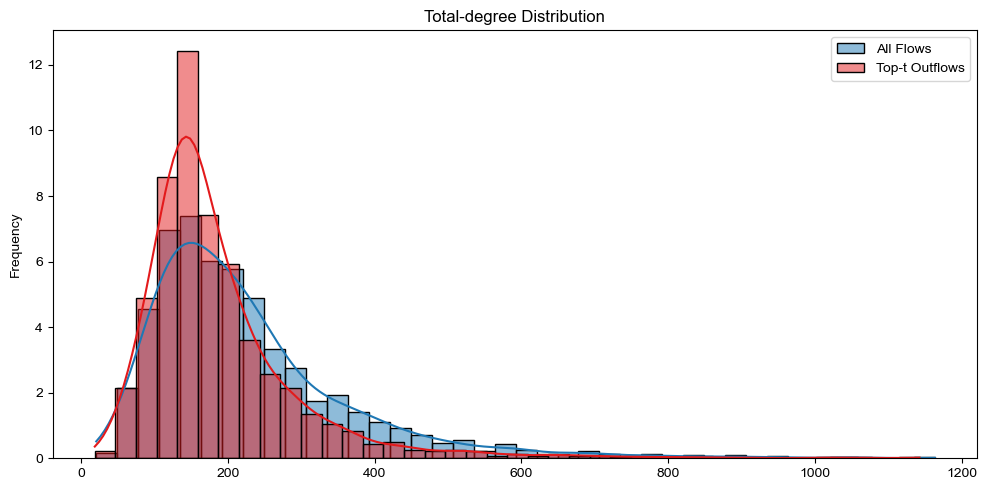

In [15]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib
# Load the data
flows = np.load(r'D:\Dropbox\urban cup\data\Mobility\cbg_visit_2021-01_4.npy')

#flows = np.load(r'..\data\北京TAZ交互流+用户属性统计\flow_matrix\bj_flow_matrix_201807_liuhuan_reduced.npy')

# Define t
t = 130
print(flows.sum())
# Construct the graph for top-t outflows
top_t_flows = np.zeros_like(flows)
for i in range(flows.shape[0]):
    # Handle case when there are less than t non-zero flows
    non_zero_flows = np.count_nonzero(flows[i])
    t_flows = min(t, non_zero_flows)
    if t_flows == 0:
        continue
    top_t_indices = np.argpartition(flows[i], -t_flows)[-t_flows:]
    top_t_flows[i, top_t_indices] = 1 # flow presence marked as 1
    
# Convert the original flows to binary
flows_binary = (flows > 0).astype(int)

# Calculate the degrees based on the new definition
degrees_all = np.sum(np.logical_or(flows_binary, flows_binary.T), axis=1)
degrees_t = np.sum(np.logical_or(top_t_flows, top_t_flows.T), axis=1)
degrees_t

# Set a color palette
palette = sns.color_palette("Paired")

# Plot the distributions
plt.figure(figsize=(10, 5))

sns.histplot(degrees_all, kde=True, stat="frequency", label='All Flows', color=palette[1], bins=40)
sns.histplot(degrees_t, kde=True, stat="frequency", label='Top-t Outflows', color=palette[5], bins=40)
plt.title('Total-degree Distribution')
plt.legend()

plt.tight_layout()
plt.savefig("total_degree_distribution.png", dpi = 300)
plt.show()

278027684.36305994


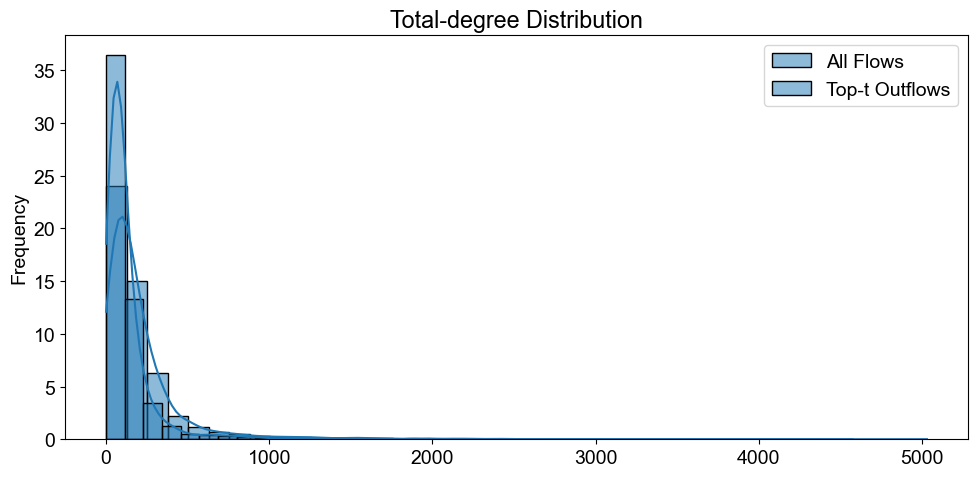

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib
# Load the data
flows = np.load(r'D:\Dropbox\urban cup\data\Mobility\cbg_visit_2019-03_1.npy')

#flows = np.load(r'..\data\北京TAZ交互流+用户属性统计\flow_matrix\bj_flow_matrix_201807_liuhuan_reduced.npy')

# Define t
t = 149
print(flows.sum())
# Construct the graph for top-t outflows
top_t_flows = np.zeros_like(flows)
top_2t_flows = np.zeros_like(flows)
top_t2_flows = np.zeros_like(flows)
for i in range(flows.shape[0]):
    # Handle case when there are less than t non-zero flows
    non_zero_flows = np.count_nonzero(flows[i])
    t_flows = min(t, non_zero_flows)
    tt_flows = min(2*t, non_zero_flows)
    t2_flows = min(t//2, non_zero_flows)
    if t_flows == 0:
        continue
    top_t_indices = np.argpartition(flows[i], -t_flows)[-t_flows:]
    top_t_flows[i, top_t_indices] = 1 # flow presence marked as 1
    top_2t_indices = np.argpartition(flows[i], -tt_flows)[-tt_flows:]
    top_2t_flows[i, top_2t_indices] = 1 # flow presence marked as 1
    top_t2_indices = np.argpartition(flows[i], -t2_flows)[-t2_flows:]
    top_t2_flows[i, top_t2_indices] = 1 # flow presence marked as 1
# Convert the original flows to binary
flows_binary = (flows > 0).astype(int)

# Calculate the degrees based on the new definition
degrees_all = np.sum(flows_binary, axis=0)
degrees_t = np.sum(top_t_flows, axis=0)
degrees_2t = np.sum(top_2t_flows, axis=0)
degrees_t2 = np.sum(top_t2_flows, axis=0)
# Change the default style of matplotlib
#matplotlib.style.use('ggplot')

# Set a color palette
#palette = sns.color_palette("Paired")

# Plot the distributions
plt.figure(figsize=(10, 5))

sns.histplot(degrees_all, kde=True, stat="frequency", label='All Flows', bins=40)
sns.histplot(degrees_t, kde=True, stat="frequency", label='Top-t Outflows', bins=40)
plt.title('Total-degree Distribution')
plt.legend()

plt.tight_layout()
#plt.savefig("total_degree_distribution.png", dpi = 300)
plt.show()

Values less than or equal to 0 in data. Throwing out 0 or negative values


Calculating best minimal value for power law fit
2.5952981104784882 119.0 0.03378231594394363
[5031, 4811, 4292, 3898, 3556, 3360, 3257, 3235, 3148, 3096, 2980, 2937, 2903, 2880, 2818, 2818, 2692, 2484, 2456, 2431, 2387, 2386, 2379, 2348, 2275, 2230, 2221, 2219, 2185, 2166, 2159, 2158, 2116, 2086, 2080, 2056, 2052, 2050, 1986, 1920, 1920, 1918, 1887, 1882, 1881, 1877, 1844, 1835, 1755, 1753, 1733, 1728, 1708, 1707, 1691, 1685, 1675, 1674, 1657, 1631, 1618, 1613, 1605, 1599, 1595, 1589, 1567, 1566, 1563, 1557, 1543, 1532, 1528, 1526, 1522, 1518, 1508, 1505, 1500, 1486, 1481, 1475, 1446, 1441, 1435, 1428, 1419, 1415, 1415, 1391, 1378, 1374, 1364, 1358, 1338, 1321, 1318, 1318, 1316, 1304, 1299, 1293, 1289, 1275, 1274, 1273, 1260, 1255, 1253, 1250, 1249, 1246, 1245, 1238, 1233, 1228, 1226, 1224, 1215, 1213, 1200, 1193, 1189, 1187, 1178, 1161, 1160, 1160, 1159, 1157, 1155, 1153, 1148, 1130, 1130, 1123, 1120, 1116, 1116, 1114, 1108, 1107, 1105, 1095, 1089, 1083, 1082, 1081, 1074, 1073, 1068,

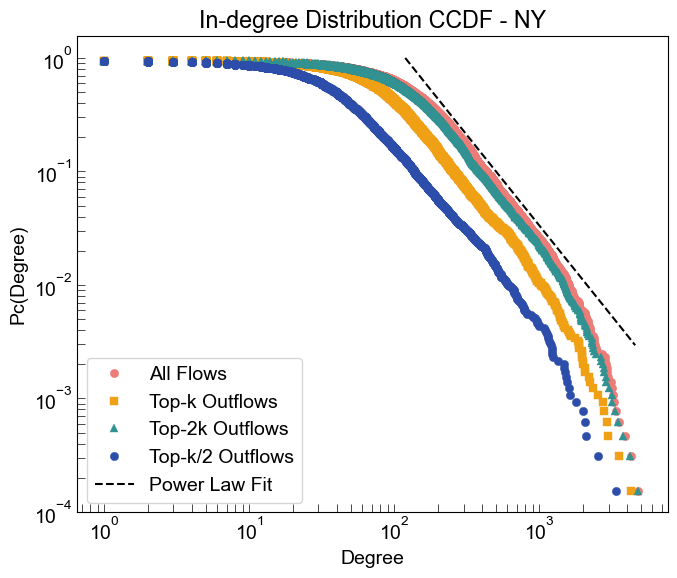

In [22]:
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
import powerlaw

plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['Arial']  # 可以替换为你喜欢的其他字体
plt.rcParams['font.size'] = 14
# Create an example network graph
#G = nx.powerlaw_cluster_graph(1000, 3, 0.2)

# Calculate the degree distribution
#degrees = [degree for _, degree in G.degree()]

# Sort the degrees in descending order
sorted_degrees = sorted(degrees_all, reverse=True)
sorted_degrees_t = sorted(degrees_t, reverse=True)
sorted_degrees_2t = sorted(degrees_2t, reverse=True)
sorted_degrees_t2 = sorted(degrees_t2, reverse=True)

# Calculate the CCDF
ccdf = [(i / len(sorted_degrees)) for i in range(len(sorted_degrees))]
ccdf_t = [(i / len(sorted_degrees_t)) for i in range(len(sorted_degrees_t))]
ccdf_2t = [(i / len(sorted_degrees_2t)) for i in range(len(sorted_degrees_2t))]
ccdf_t2 = [(i / len(sorted_degrees_t2)) for i in range(len(sorted_degrees_t2))]

fit = powerlaw.Fit(sorted_degrees_t, discrete=True)
print(fit.power_law.alpha, fit.power_law.xmin, fit.power_law.sigma)
print(sorted_degrees, ccdf)
# Plot the CCDF
figure = plt.figure(figsize=(7, 6))
ax = figure.add_subplot(111)

#colors = ['#d2504c', '#f0a015', '#49287e', '#2c4eaa']
colors = ['#eb7c77', '#f0a015', '#329291', '#2c4eaa']


# Filter and plot only degrees >= 50
mask = np.array(sorted_degrees) >= 0
plt.plot(np.array(sorted_degrees)[mask][::-1], np.array(ccdf)[mask][::-1], 'o', color=colors[0], label='All Flows', mew=0.3)

mask_t = np.array(sorted_degrees_t) >= 0
plt.plot(np.array(sorted_degrees_t)[mask_t][::-1], np.array(ccdf_t)[mask_t][::-1], 's', color=colors[1], label='Top-k Outflows', mew=0.3)

mask_2t = np.array(sorted_degrees_2t) >= 0
plt.plot(np.array(sorted_degrees_2t)[mask_2t][::-1], np.array(ccdf_2t)[mask_2t][::-1], '^', color=colors[2], label='Top-2k Outflows', mew=0.3)

mask_t2 = np.array(sorted_degrees_t2) >= 0
plt.plot(np.array(sorted_degrees_t2)[mask_t2][::-1], np.array(ccdf_t2)[mask_t2][::-1], 'o', color=colors[3], label='Top-k/2 Outflows', mew=0.3)
fit.power_law.plot_ccdf(ax=ax, color='black', linestyle='--', label='Power Law Fit')

plt.xlabel('Degree')
plt.ylabel('Pc(Degree)')
plt.legend(loc = 'lower left')
ax.set_xscale('log')
ax.set_yscale('log')
# Move the tick lines inside the plot
ax.tick_params(direction='in', length=6, width=0.5, colors='k', which='both')

plt.title('In-degree Distribution CCDF - NY')
plt.tight_layout()

plt.savefig("ccdf_in_degree_distribution_NY_1903_test.png",dpi = 300)
plt.show()



Values less than or equal to 0 in data. Throwing out 0 or negative values


Calculating best minimal value for power law fit
3.6115715627396785 181.0 0.03896566183400132
[5095, 4875, 4355, 3959, 3675, 3433, 3389, 3363, 3254, 3225, 3076, 3034, 3027, 3020, 2985, 2924, 2819, 2813, 2813, 2699, 2617, 2589, 2508, 2490, 2471, 2437, 2422, 2363, 2301, 2299, 2291, 2280, 2279, 2275, 2254, 2231, 2216, 2199, 2135, 2114, 2103, 2089, 2073, 2068, 2040, 1976, 1975, 1974, 1960, 1950, 1915, 1899, 1895, 1893, 1852, 1822, 1821, 1819, 1807, 1800, 1781, 1772, 1772, 1763, 1762, 1747, 1722, 1719, 1717, 1706, 1696, 1696, 1695, 1669, 1658, 1657, 1650, 1619, 1607, 1605, 1590, 1588, 1584, 1566, 1557, 1543, 1520, 1517, 1513, 1506, 1496, 1494, 1490, 1487, 1483, 1479, 1478, 1477, 1476, 1456, 1455, 1447, 1425, 1423, 1416, 1415, 1412, 1409, 1405, 1402, 1400, 1398, 1396, 1395, 1371, 1370, 1365, 1364, 1363, 1358, 1355, 1346, 1339, 1336, 1335, 1335, 1331, 1330, 1328, 1321, 1316, 1310, 1310, 1310, 1304, 1296, 1289, 1289, 1277, 1275, 1274, 1273, 1271, 1263, 1247, 1243, 1237, 1229, 1229, 1220, 1218,

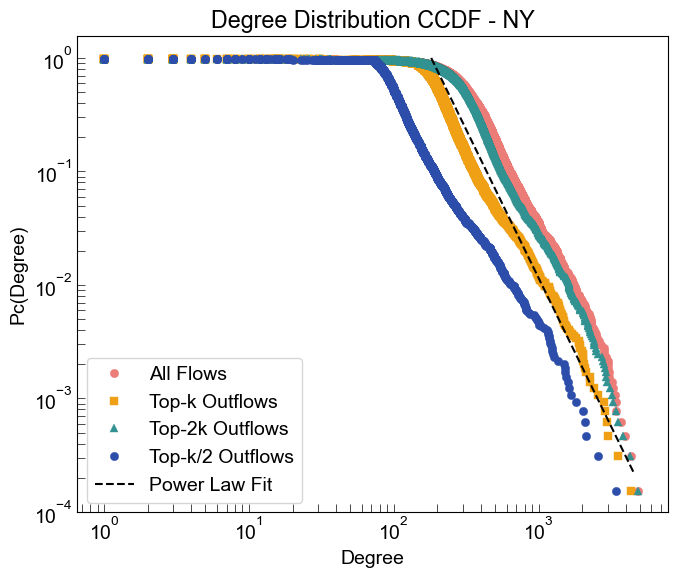

In [6]:
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
import powerlaw

plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['Arial']  # 可以替换为你喜欢的其他字体
plt.rcParams['font.size'] = 14
# Create an example network graph
#G = nx.powerlaw_cluster_graph(1000, 3, 0.2)

# Calculate the degree distribution
#degrees = [degree for _, degree in G.degree()]

# Sort the degrees in descending order
sorted_degrees = sorted(degrees_all, reverse=True)
sorted_degrees_t = sorted(degrees_t, reverse=True)
sorted_degrees_2t = sorted(degrees_2t, reverse=True)
sorted_degrees_t2 = sorted(degrees_t2, reverse=True)

# Calculate the CCDF
ccdf = [(i / len(sorted_degrees)) for i in range(len(sorted_degrees))]
ccdf_t = [(i / len(sorted_degrees_t)) for i in range(len(sorted_degrees_t))]
ccdf_2t = [(i / len(sorted_degrees_2t)) for i in range(len(sorted_degrees_2t))]
ccdf_t2 = [(i / len(sorted_degrees_t2)) for i in range(len(sorted_degrees_t2))]

fit = powerlaw.Fit(sorted_degrees_t, discrete=True)
print(fit.power_law.alpha, fit.power_law.xmin, fit.power_law.sigma)
print(sorted_degrees, ccdf)
# Plot the CCDF
figure = plt.figure(figsize=(7, 6))
ax = figure.add_subplot(111)

#colors = ['#d2504c', '#f0a015', '#49287e', '#2c4eaa']
colors = ['#eb7c77', '#f0a015', '#329291', '#2c4eaa']

plt.plot(sorted_degrees[::-1], ccdf[::-1], 'o', color=colors[0], label='All Flows', mew=0.3)
plt.plot(sorted_degrees_t[::-1], ccdf_t[::-1],  's', color =colors[1], label='Top-k Outflows',  mew=0.3)
plt.plot(sorted_degrees_2t[::-1], ccdf_2t[::-1], '^', color=colors[2], label='Top-2k Outflows',  mew=0.3)
plt.plot(sorted_degrees_t2[::-1], ccdf_t2[::-1], 'o', color=colors[3], label='Top-k/2 Outflows',  mew=0.3)
fit.power_law.plot_ccdf(ax=ax, color='black', linestyle='--', label='Power Law Fit')

plt.xlabel('Degree')
plt.ylabel('Pc(Degree)')
plt.legend(loc = 'lower left')
ax.set_xscale('log')
ax.set_yscale('log')
# Move the tick lines inside the plot
ax.tick_params(direction='in', length=6, width=0.5, colors='k', which='both')

plt.title('Degree Distribution CCDF - NY')
plt.tight_layout()

plt.savefig("ccdf_total_degree_distribution_NY_1903_test.png",dpi = 300)
plt.show()



C:\Users\zwy99\AppData\Local\Temp\ipykernel_49504\662231053.py:16: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "g^" (-> color='g'). The keyword argument will take precedence.
  plt.loglog(bins_t[:-1], counts_t/degrees_t.shape[0], 'g^', color ='g',markerfacecolor='none', label='Top-t Outflows')
C:\Users\zwy99\AppData\Local\Temp\ipykernel_49504\662231053.py:17: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "r*" (-> color='r'). The keyword argument will take precedence.
  plt.loglog(bins_2t[:-1], counts_2t/degrees_2t.shape[0], 'r*', color='r',markerfacecolor='none', label='Top-2t Outflows')
C:\Users\zwy99\AppData\Local\Temp\ipykernel_49504\662231053.py:18: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "y+" (-> color='y'). The keyword argument will take precedence.
  plt.loglog(bins_t2[:-1], counts_t2/degrees_t2.shape[0], 'y+', color='y',markerfacec

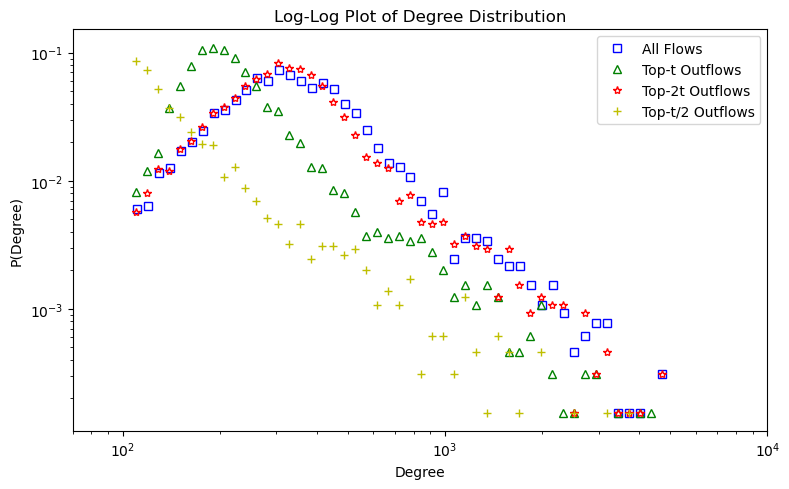

In [ ]:
# Degree Distribution focusing on nodes with degree > 109
import numpy as np
import matplotlib.pyplot as plt

plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['Arial']  # 可以替换为你喜欢的其他字体
partial_degrees_all = degrees_all[degrees_all > 109]
partial_degrees_t = degrees_t[degrees_t > 109]
# Calculate the degree distribution frequencies
counts_all, bins_all = np.histogram(degrees_all, bins=np.logspace(np.log10(min(partial_degrees_all+1)), np.log10(max(partial_degrees_all)), num=50))
counts_t, bins_t = np.histogram(degrees_t, bins=np.logspace(np.log10(min(partial_degrees_all)), np.log10(max(partial_degrees_all)), num=50))
counts_2t, bins_2t = np.histogram(degrees_2t, bins=np.logspace(np.log10(min(partial_degrees_all)), np.log10(max(partial_degrees_all)), num=50))
counts_t2, bins_t2 = np.histogram(degrees_t2, bins=np.logspace(np.log10(min(partial_degrees_all)), np.log10(max(partial_degrees_all)), num=50))

# Generate the log-log plot
plt.figure(figsize=(8, 5))
plt.loglog(bins_all[:-1], counts_all/degrees_all.shape[0], 's', markerfacecolor='none',color='b', label='All Flows')
plt.loglog(bins_t[:-1], counts_t/degrees_t.shape[0], 'g^', color ='g',markerfacecolor='none', label='Top-t Outflows')
plt.loglog(bins_2t[:-1], counts_2t/degrees_2t.shape[0], 'r*', color='r',markerfacecolor='none', label='Top-2t Outflows')
plt.loglog(bins_t2[:-1], counts_t2/degrees_t2.shape[0], 'y+', color='y',markerfacecolor='none', label='Top-t/2 Outflows')
plt.title('Log-Log Plot of Degree Distribution')
plt.xlabel('Degree')
plt.ylabel('P(Degree)')
plt.xlim(70, 10000)
#plt.xlim(90, 3000)
plt.legend()

#plt.savefig("in_degree_distribution_NY_1804(1).png",dpi = 300)
#plt.savefig("total_degree_distribution_LA_1903.png",dpi = 300)
plt.tight_layout()
plt.show()

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import networkx as nx
import powerlaw

plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['Arial']  # 可以替换为你喜欢的其他字体
cities = ['New York, NY', 'Los Angeles, CA', 'Chicago, IL', 'Houston, TX', 'Phoenix, AZ', 'Philadelphia, PA', 'San Antonio, TX', 'San Diego, CA', 'Dallas, TX', 'San Jose, CA']

k_values = pd.read_csv(r".\k_select_US_newNY_2percent.csv")
for city in range(1,11):
    print(city, cities[city-1])
    years = range(2018,2022)
    for year in years:
        for month in range(1,13):
            flows = np.load(r'D:\Dropbox\urban cup\data\Mobility\cbg_visit_{year_}-{month_}_{city_}.npy'.format(year_ = year, month_ = str(month).zfill(2),city_ = city))
            # Define t
            t = k_values.loc[(year-2018)*12+month-1, cities[city-1]]
            
            print(t)
            # Construct the graph for top-t outflows
            top_t_flows = np.zeros_like(flows)
            top_2t_flows = np.zeros_like(flows)
            top_t2_flows = np.zeros_like(flows)
            for i in range(flows.shape[0]):
                # Handle case when there are less than t non-zero flows
                non_zero_flows = np.count_nonzero(flows[i])
                t_flows = min(t, non_zero_flows)
                tt_flows = min(2*t, non_zero_flows)
                t2_flows = min(t//2, non_zero_flows)
                if t_flows == 0:
                    continue
                top_t_indices = np.argpartition(flows[i], -t_flows)[-t_flows:]
                top_t_flows[i, top_t_indices] = 1 # flow presence marked as 1
                top_2t_indices = np.argpartition(flows[i], -tt_flows)[-tt_flows:]
                top_2t_flows[i, top_2t_indices] = 1 # flow presence marked as 1
                top_t2_indices = np.argpartition(flows[i], -t2_flows)[-t2_flows:]
                top_t2_flows[i, top_t2_indices] = 1 # flow presence marked as 1
            # Convert the original flows to binary
            flows_binary = (flows > 0).astype(int)

            # Calculate the degrees based on the new definition
            """degrees_all = np.sum(np.logical_or(flows_binary, flows_binary.T), axis=1)
            degrees_t = np.sum(np.logical_or(top_t_flows, top_t_flows.T), axis=1)
            degrees_2t = np.sum(np.logical_or(top_2t_flows, top_2t_flows.T), axis=1)
            degrees_t2 = np.sum(np.logical_or(top_t2_flows, top_t2_flows.T), axis=1)"""
            degrees_all = np.sum(flows_binary, axis=0)
            degrees_t = np.sum(top_t_flows, axis=0)
            degrees_2t = np.sum(top_2t_flows, axis=0)
            degrees_t2 = np.sum(top_t2_flows, axis=0)
            # Sort the degrees in descending order
            sorted_degrees = sorted(degrees_all, reverse=True)
            sorted_degrees_t = sorted(degrees_t, reverse=True)
            sorted_degrees_2t = sorted(degrees_2t, reverse=True)
            sorted_degrees_t2 = sorted(degrees_t2, reverse=True)

            # Calculate the CCDF
            ccdf = [(i / len(sorted_degrees)) for i in range(len(sorted_degrees))]
            ccdf_t = [(i / len(sorted_degrees_t)) for i in range(len(sorted_degrees_t))]
            ccdf_2t = [(i / len(sorted_degrees_2t)) for i in range(len(sorted_degrees_2t))]
            ccdf_t2 = [(i / len(sorted_degrees_t2)) for i in range(len(sorted_degrees_t2))]

            fit = powerlaw.Fit(sorted_degrees_t, discrete=True)
            print(fit.power_law.alpha, fit.power_law.xmin, fit.power_law.sigma)
            print(sorted_degrees, ccdf)
            # Plot the CCDF
            figure = plt.figure(figsize=(6, 4))
            ax = figure.add_subplot(111)

            #colors = ['#d2504c', '#f0a015', '#49287e', '#2c4eaa']
            colors = ['#eb7c77', '#f0a015', '#329291', '#2c4eaa']

            plt.plot(sorted_degrees[::-1], ccdf[::-1], 'o', color=colors[0], label='All Flows',markersize=3)
            plt.plot(sorted_degrees_t[::-1], ccdf_t[::-1],  's', color =colors[1], label='Top-k Outflows',  markersize=3)
            plt.plot(sorted_degrees_2t[::-1], ccdf_2t[::-1], '^', color=colors[2], label='Top-2k Outflows', markersize=3)
            plt.plot(sorted_degrees_t2[::-1], ccdf_t2[::-1], 'o', color=colors[3], label='Top-k/2 Outflows', markersize=3)
            fit.power_law.plot_ccdf(ax=ax, color='black', linestyle='--', label='Power Law Fit')

            plt.xlabel('Degree')
            plt.ylabel('Pc(Degree)')
            plt.legend()
            ax.set_xscale('log')
            ax.set_yscale('log')
            # Move the tick lines inside the plot
            ax.tick_params(direction='in', length=6, width=0.5, colors='k', which='both')

            plt.title("In-degree CCDF {c} {date}, k = {k}".format(c = cities[city-1],date = str(year)+str(month).zfill(2), k =t))
            plt.tight_layout()

            plt.savefig(r"..\figures\powerlaw\ccdf_in_degree_distribution_{c}_{date}, k = {k}.png".format(c = cities[city-1],date = str(year)+str(month).zfill(2), k =t),dpi = 300)
            plt.show()



In [11]:
import numpy as np
import networkx as nx
import geopandas as gpd
import pandas as pd
import networkx as nx

def extract_water_in_NY():
    cbgs = gpd.read_file(r"D:\Dropbox\urban cup\arcgis project\cbgs\cbgs_of_cities\New_York_city.shp")
    with open(r'D:\Dropbox\urban cup\data\Mobility\id_dict_1.pkl', 'rb') as f:
        id_dict = pickle.load(f)

        # Extract the lines that not in cbgs but in id_dict
        id_dict_keys = list(id_dict.keys())
        cbgs_keys = list(cbgs['CBG_Code'].values)
        not_in_cbgs = []
        for i in id_dict_keys:
            if id_dict[id_dict_keys[i]] not in cbgs_keys:
                not_in_cbgs.append(i)
        return not_in_cbgs


def preprocess_flows(flow_matrix, percentile=2):
    """
    预处理流量数据，删除总度数前2%小的节点，然后取最大连通子图。
    
    :param flows: 原始流量矩阵（numpy array）
    :return: 处理过的流量矩阵（numpy array）
    """
    # Set the diagonal elements to zero
    np.fill_diagonal(flow_matrix, 0)

    # Create directed graph from flow matrix
    G = nx.from_numpy_array(flow_matrix, create_using=nx.DiGraph)

    # Convert graph to numpy adjacency matrix
    adj_matrix = nx.adjacency_matrix(G)
    numpy_array = adj_matrix.toarray()
    # Convert the original flows to binary
    flows_binary = (numpy_array > 0).astype(int)
    # Calculate the degrees based on the new definition
    degrees_all = np.sum(np.logical_or(flows_binary, flows_binary.T), axis=1)

    # Determine the 2% degree threshold
    percentile_threshold = np.percentile(degrees_all, percentile)

    # find the nodes whose degree are in the lowest 2%
    nodes_to_remove = np.where(degrees_all <= percentile_threshold)[0]
    print('Number of nodes to remove: ', len(nodes_to_remove))

    # Remove the nodes from the matrix
    reduced_matrix = np.delete(numpy_array, nodes_to_remove, axis=0)
    reduced_matrix = np.delete(reduced_matrix, nodes_to_remove, axis=1)

    # Create directed graph from the reduced matrix
    reduced_G = nx.from_numpy_array(reduced_matrix, create_using=nx.DiGraph)
    
    # Find all strongly connected components in the reduced graph
    scc = list(nx.strongly_connected_components(reduced_G))
    # Create a subgraph with only nodes in the largest SCC
    strongly_connected_G = reduced_G.subgraph(max(scc, key=len))
    processed_flows = nx.to_numpy_array(strongly_connected_G)
    return processed_flows

# 后续代码  
# 例如，使用此函数处理流量数据：
# flows = np.load('path_to_flows.npy')
# processed_flows = preprocess_flows(flows)




1 New York, NY
Number of nodes to remove:  131
2 Los Angeles, CA
Number of nodes to remove:  54
3 Chicago, IL
Number of nodes to remove:  44
4 Houston, TX
Number of nodes to remove:  33
5 Phoenix, AZ
Number of nodes to remove:  21
6 Philadelphia, PA
Number of nodes to remove:  27
7 San Antonio, TX
Number of nodes to remove:  19
8 San Diego, CA
Number of nodes to remove:  17
9 Dallas, TX
Number of nodes to remove:  19
10 San Jose, CA
Number of nodes to remove:  12


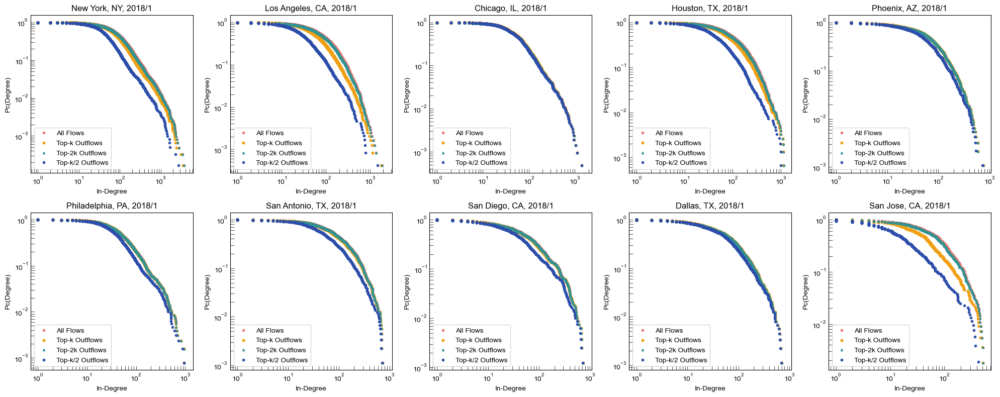

1 New York, NY
Number of nodes to remove:  140
2 Los Angeles, CA
Number of nodes to remove:  51
3 Chicago, IL
Number of nodes to remove:  53
4 Houston, TX
Number of nodes to remove:  35
5 Phoenix, AZ
Number of nodes to remove:  21
6 Philadelphia, PA
Number of nodes to remove:  27
7 San Antonio, TX
Number of nodes to remove:  19
8 San Diego, CA
Number of nodes to remove:  19
9 Dallas, TX
Number of nodes to remove:  19
10 San Jose, CA
Number of nodes to remove:  12


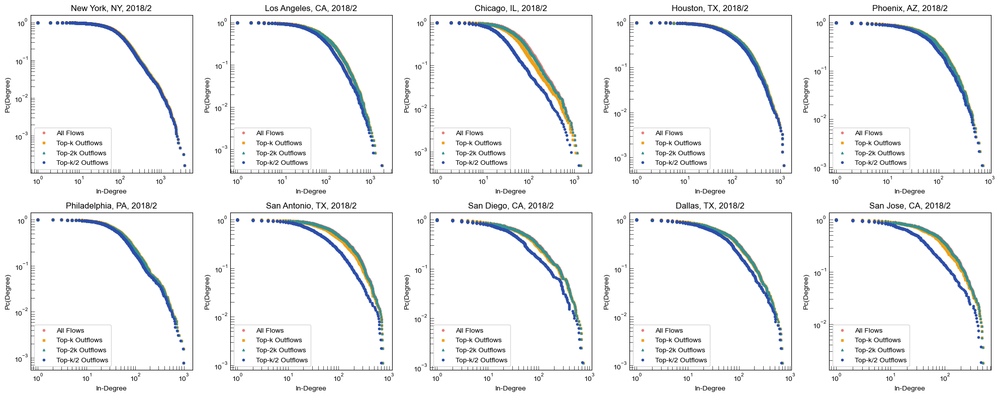

1 New York, NY
Number of nodes to remove:  141
2 Los Angeles, CA
Number of nodes to remove:  51
3 Chicago, IL
Number of nodes to remove:  44
4 Houston, TX
Number of nodes to remove:  32
5 Phoenix, AZ
Number of nodes to remove:  20
6 Philadelphia, PA
Number of nodes to remove:  27
7 San Antonio, TX
Number of nodes to remove:  20
8 San Diego, CA
Number of nodes to remove:  18
9 Dallas, TX
Number of nodes to remove:  21
10 San Jose, CA
Number of nodes to remove:  12


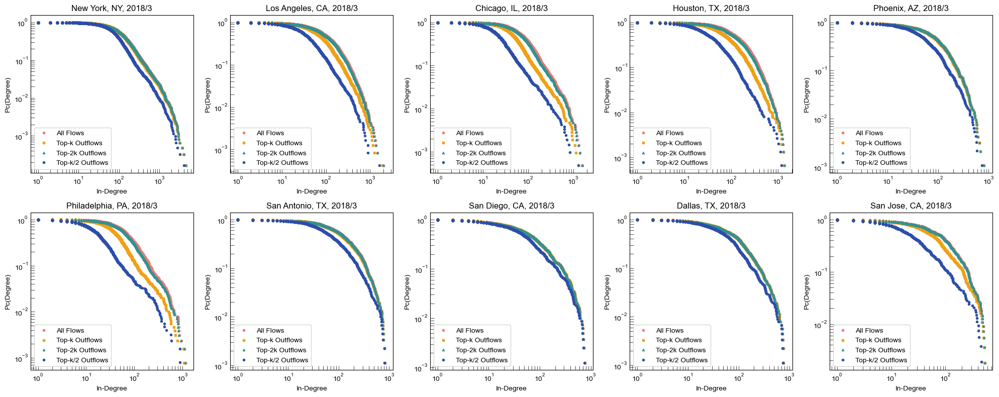

1 New York, NY
Number of nodes to remove:  138
2 Los Angeles, CA
Number of nodes to remove:  54
3 Chicago, IL
Number of nodes to remove:  45
4 Houston, TX
Number of nodes to remove:  32
5 Phoenix, AZ
Number of nodes to remove:  22
6 Philadelphia, PA
Number of nodes to remove:  29
7 San Antonio, TX
Number of nodes to remove:  20
8 San Diego, CA
Number of nodes to remove:  17
9 Dallas, TX
Number of nodes to remove:  20
10 San Jose, CA
Number of nodes to remove:  12


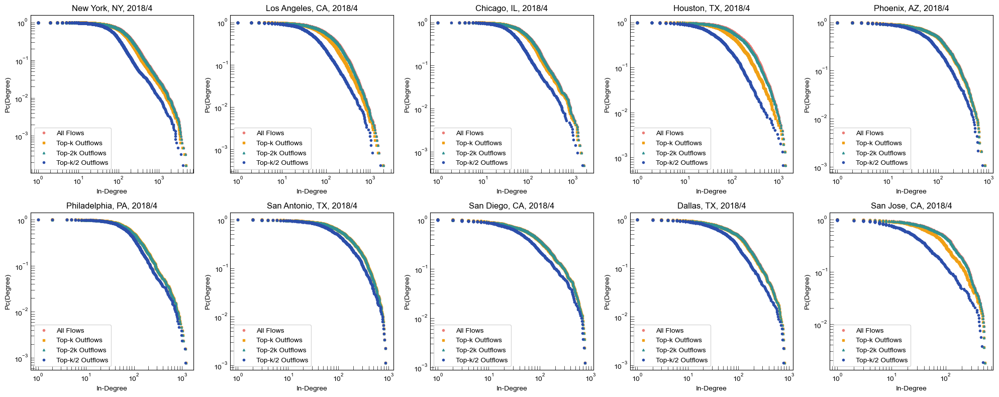

1 New York, NY
Number of nodes to remove:  139
2 Los Angeles, CA
Number of nodes to remove:  51
3 Chicago, IL
Number of nodes to remove:  44
4 Houston, TX
Number of nodes to remove:  32
5 Phoenix, AZ
Number of nodes to remove:  21
6 Philadelphia, PA
Number of nodes to remove:  28
7 San Antonio, TX
Number of nodes to remove:  21
8 San Diego, CA
Number of nodes to remove:  17
9 Dallas, TX
Number of nodes to remove:  20
10 San Jose, CA
Number of nodes to remove:  12


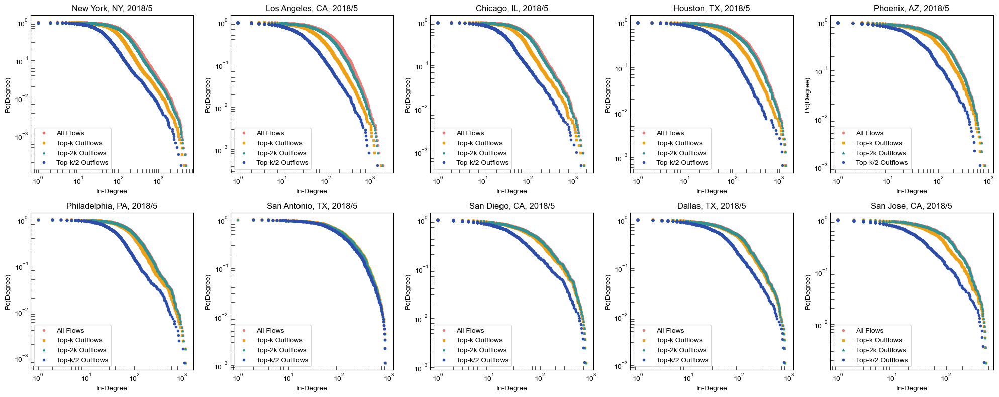

1 New York, NY
Number of nodes to remove:  131
2 Los Angeles, CA
Number of nodes to remove:  51
3 Chicago, IL
Number of nodes to remove:  45
4 Houston, TX
Number of nodes to remove:  32
5 Phoenix, AZ
Number of nodes to remove:  20
6 Philadelphia, PA
Number of nodes to remove:  29
7 San Antonio, TX
Number of nodes to remove:  22
8 San Diego, CA
Number of nodes to remove:  19
9 Dallas, TX
Number of nodes to remove:  20
10 San Jose, CA
Number of nodes to remove:  12


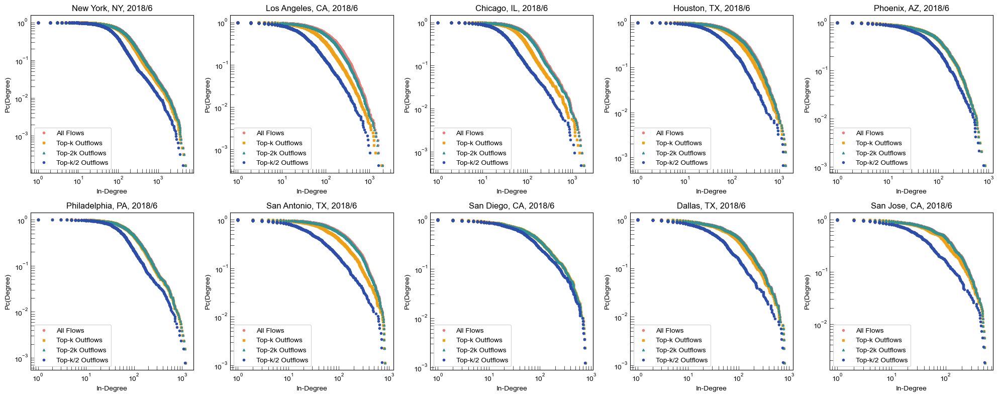

1 New York, NY
Number of nodes to remove:  137
2 Los Angeles, CA
Number of nodes to remove:  51
3 Chicago, IL
Number of nodes to remove:  46
4 Houston, TX
Number of nodes to remove:  32
5 Phoenix, AZ
Number of nodes to remove:  20
6 Philadelphia, PA
Number of nodes to remove:  27
7 San Antonio, TX
Number of nodes to remove:  20
8 San Diego, CA
Number of nodes to remove:  17
9 Dallas, TX
Number of nodes to remove:  20
10 San Jose, CA
Number of nodes to remove:  12


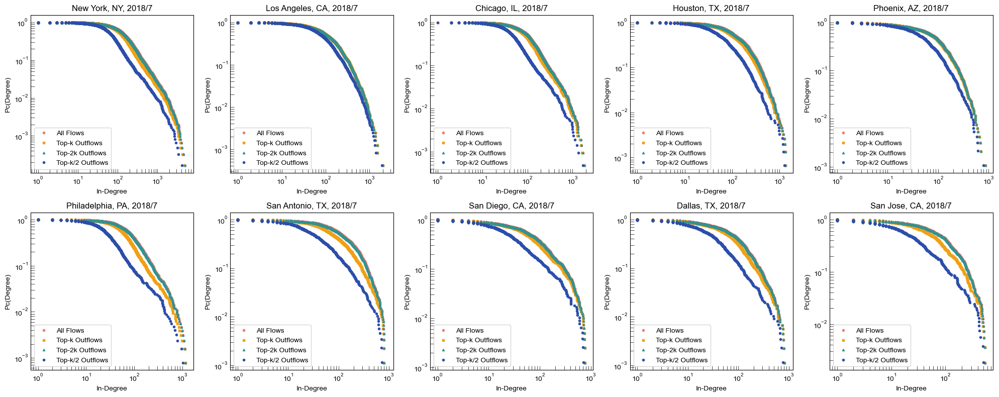

1 New York, NY
Number of nodes to remove:  141
2 Los Angeles, CA
Number of nodes to remove:  52
3 Chicago, IL
Number of nodes to remove:  44
4 Houston, TX
Number of nodes to remove:  32
5 Phoenix, AZ
Number of nodes to remove:  22
6 Philadelphia, PA
Number of nodes to remove:  29
7 San Antonio, TX
Number of nodes to remove:  21
8 San Diego, CA
Number of nodes to remove:  18
9 Dallas, TX
Number of nodes to remove:  21
10 San Jose, CA
Number of nodes to remove:  13


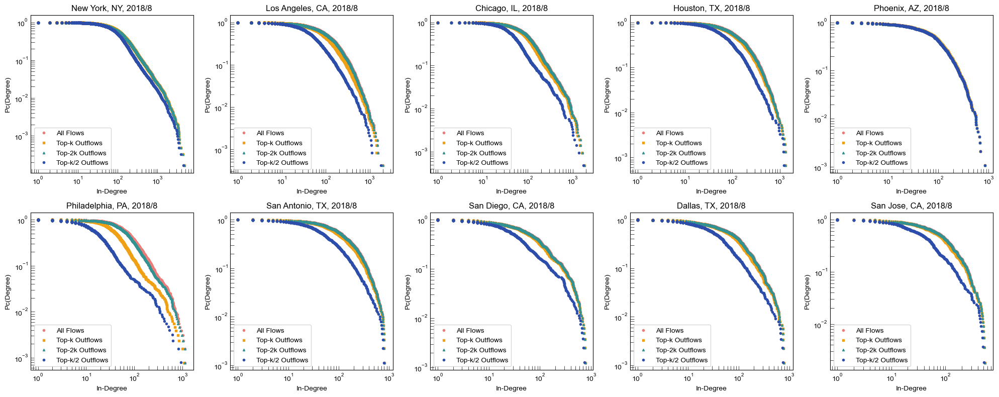

1 New York, NY
Number of nodes to remove:  132
2 Los Angeles, CA
Number of nodes to remove:  56
3 Chicago, IL
Number of nodes to remove:  45
4 Houston, TX
Number of nodes to remove:  33
5 Phoenix, AZ
Number of nodes to remove:  20
6 Philadelphia, PA
Number of nodes to remove:  28
7 San Antonio, TX
Number of nodes to remove:  20
8 San Diego, CA
Number of nodes to remove:  17
9 Dallas, TX
Number of nodes to remove:  20
10 San Jose, CA
Number of nodes to remove:  12


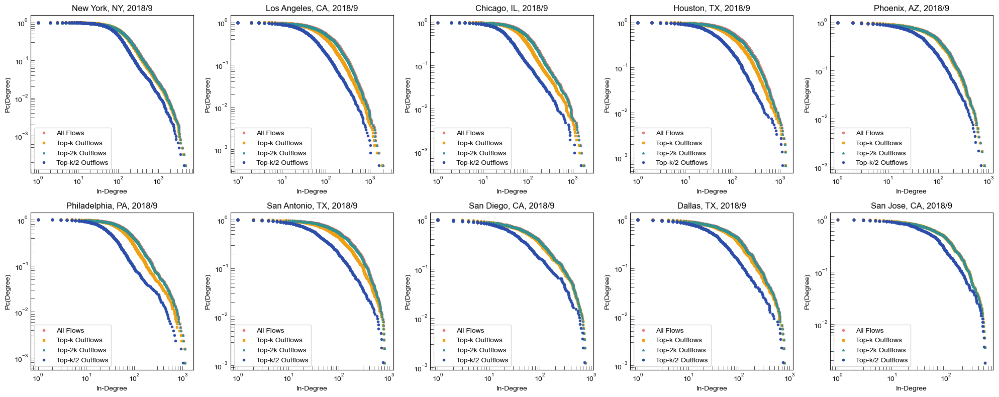

1 New York, NY
Number of nodes to remove:  135
2 Los Angeles, CA
Number of nodes to remove:  52
3 Chicago, IL
Number of nodes to remove:  44
4 Houston, TX
Number of nodes to remove:  34
5 Phoenix, AZ
Number of nodes to remove:  20
6 Philadelphia, PA
Number of nodes to remove:  28
7 San Antonio, TX
Number of nodes to remove:  19
8 San Diego, CA
Number of nodes to remove:  17
9 Dallas, TX
Number of nodes to remove:  20
10 San Jose, CA
Number of nodes to remove:  13


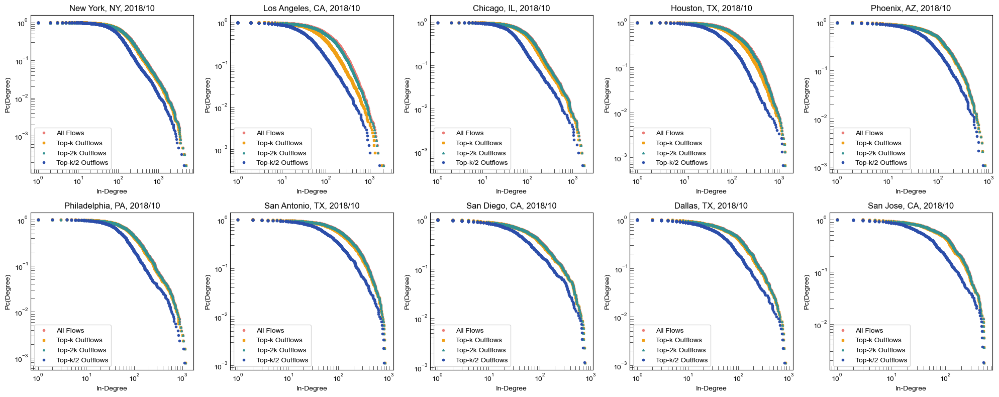

1 New York, NY
Number of nodes to remove:  135
2 Los Angeles, CA
Number of nodes to remove:  52
3 Chicago, IL
Number of nodes to remove:  45
4 Houston, TX
Number of nodes to remove:  32
5 Phoenix, AZ
Number of nodes to remove:  25
6 Philadelphia, PA
Number of nodes to remove:  27
7 San Antonio, TX
Number of nodes to remove:  20
8 San Diego, CA
Number of nodes to remove:  18
9 Dallas, TX
Number of nodes to remove:  20
10 San Jose, CA
Number of nodes to remove:  15


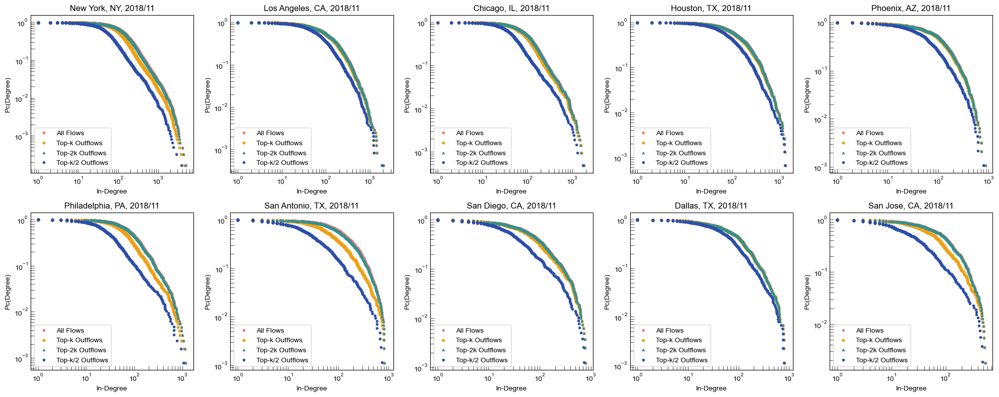

1 New York, NY
Number of nodes to remove:  136
2 Los Angeles, CA
Number of nodes to remove:  53
3 Chicago, IL
Number of nodes to remove:  45
4 Houston, TX
Number of nodes to remove:  32
5 Phoenix, AZ
Number of nodes to remove:  20
6 Philadelphia, PA
Number of nodes to remove:  27
7 San Antonio, TX
Number of nodes to remove:  19
8 San Diego, CA
Number of nodes to remove:  17
9 Dallas, TX
Number of nodes to remove:  19
10 San Jose, CA
Number of nodes to remove:  12


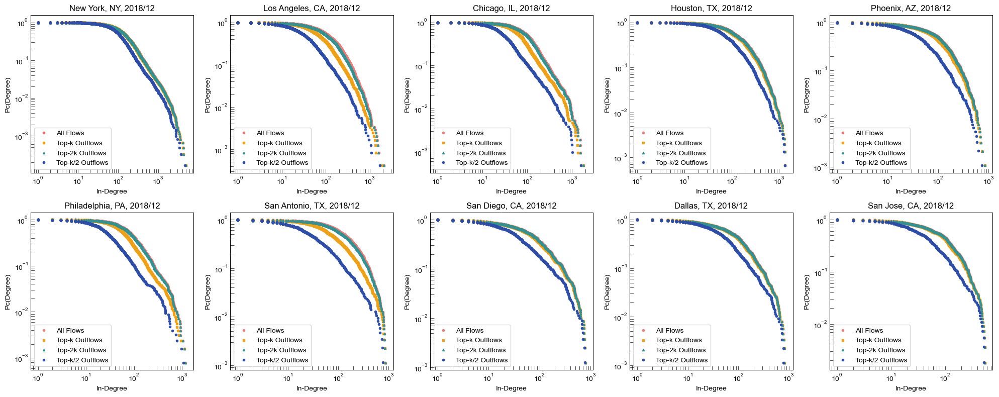

1 New York, NY
Number of nodes to remove:  133
2 Los Angeles, CA
Number of nodes to remove:  53
3 Chicago, IL
Number of nodes to remove:  44
4 Houston, TX
Number of nodes to remove:  33
5 Phoenix, AZ
Number of nodes to remove:  21
6 Philadelphia, PA
Number of nodes to remove:  29
7 San Antonio, TX
Number of nodes to remove:  20
8 San Diego, CA
Number of nodes to remove:  17
9 Dallas, TX
Number of nodes to remove:  19
10 San Jose, CA
Number of nodes to remove:  12


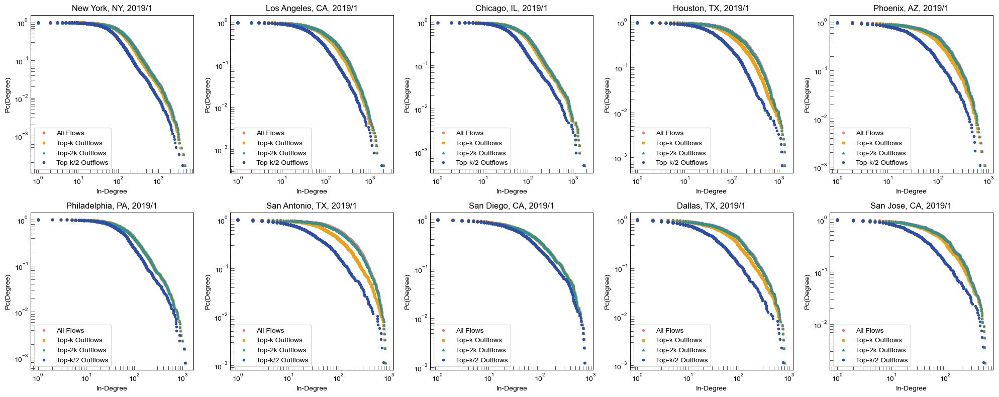

1 New York, NY
Number of nodes to remove:  133
2 Los Angeles, CA
Number of nodes to remove:  52
3 Chicago, IL
Number of nodes to remove:  44
4 Houston, TX
Number of nodes to remove:  32
5 Phoenix, AZ
Number of nodes to remove:  23
6 Philadelphia, PA
Number of nodes to remove:  28
7 San Antonio, TX
Number of nodes to remove:  19
8 San Diego, CA
Number of nodes to remove:  17
9 Dallas, TX
Number of nodes to remove:  20
10 San Jose, CA
Number of nodes to remove:  12


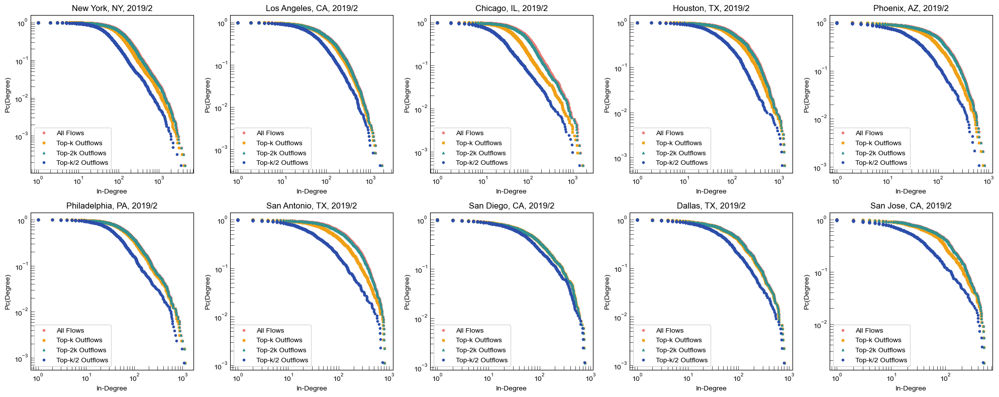

1 New York, NY
Number of nodes to remove:  135
2 Los Angeles, CA
Number of nodes to remove:  51
3 Chicago, IL
Number of nodes to remove:  46
4 Houston, TX
Number of nodes to remove:  32
5 Phoenix, AZ
Number of nodes to remove:  20
6 Philadelphia, PA
Number of nodes to remove:  29
7 San Antonio, TX
Number of nodes to remove:  19
8 San Diego, CA
Number of nodes to remove:  17
9 Dallas, TX
Number of nodes to remove:  20
10 San Jose, CA
Number of nodes to remove:  12


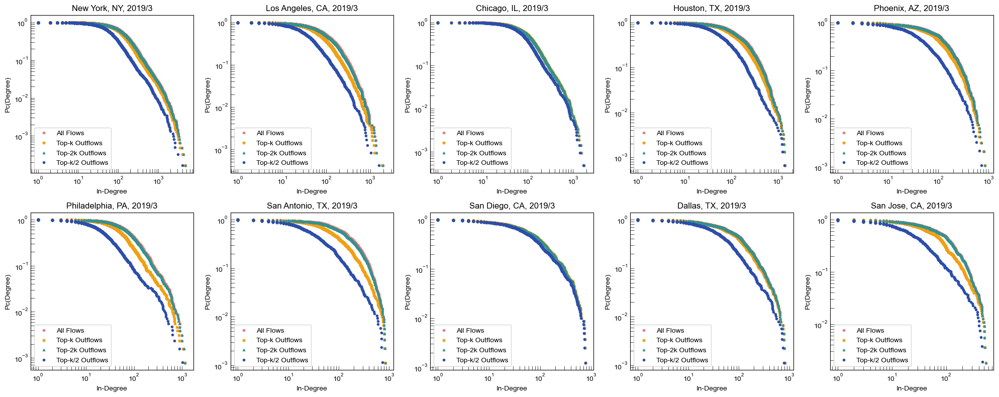

1 New York, NY
Number of nodes to remove:  133
2 Los Angeles, CA
Number of nodes to remove:  51
3 Chicago, IL
Number of nodes to remove:  44
4 Houston, TX
Number of nodes to remove:  32
5 Phoenix, AZ
Number of nodes to remove:  20
6 Philadelphia, PA
Number of nodes to remove:  28
7 San Antonio, TX
Number of nodes to remove:  20
8 San Diego, CA
Number of nodes to remove:  17
9 Dallas, TX
Number of nodes to remove:  19
10 San Jose, CA
Number of nodes to remove:  12


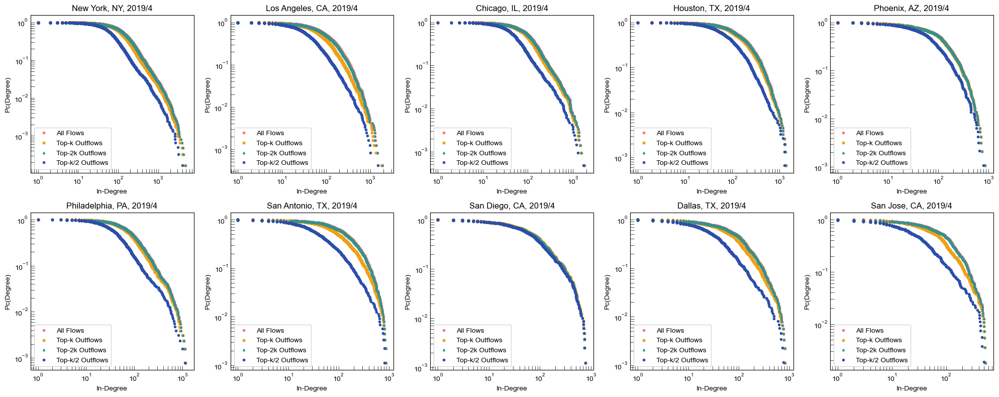

1 New York, NY
Number of nodes to remove:  133
2 Los Angeles, CA
Number of nodes to remove:  53
3 Chicago, IL
Number of nodes to remove:  50
4 Houston, TX
Number of nodes to remove:  33
5 Phoenix, AZ
Number of nodes to remove:  20
6 Philadelphia, PA
Number of nodes to remove:  27
7 San Antonio, TX
Number of nodes to remove:  20
8 San Diego, CA
Number of nodes to remove:  21
9 Dallas, TX
Number of nodes to remove:  19
10 San Jose, CA
Number of nodes to remove:  12


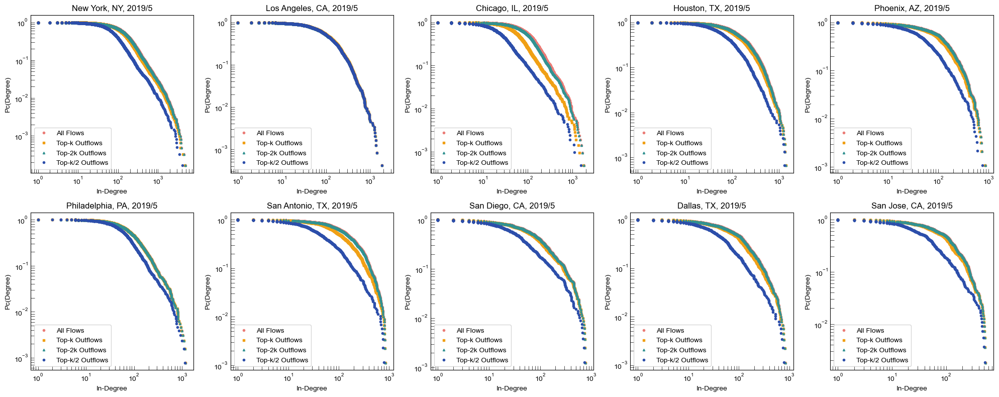

1 New York, NY
Number of nodes to remove:  131
2 Los Angeles, CA
Number of nodes to remove:  52
3 Chicago, IL
Number of nodes to remove:  46
4 Houston, TX
Number of nodes to remove:  32
5 Phoenix, AZ
Number of nodes to remove:  20
6 Philadelphia, PA
Number of nodes to remove:  28
7 San Antonio, TX
Number of nodes to remove:  19
8 San Diego, CA
Number of nodes to remove:  18
9 Dallas, TX
Number of nodes to remove:  19
10 San Jose, CA
Number of nodes to remove:  12


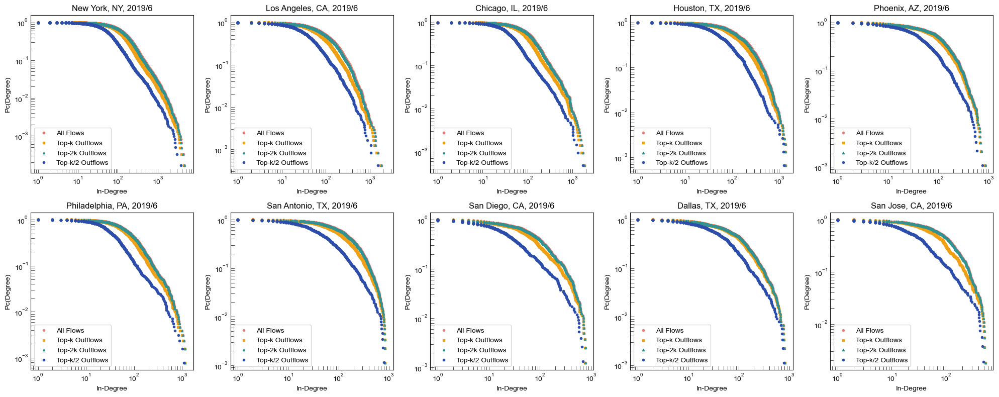

1 New York, NY
Number of nodes to remove:  134
2 Los Angeles, CA
Number of nodes to remove:  52
3 Chicago, IL
Number of nodes to remove:  44
4 Houston, TX
Number of nodes to remove:  32
5 Phoenix, AZ
Number of nodes to remove:  20
6 Philadelphia, PA
Number of nodes to remove:  27
7 San Antonio, TX
Number of nodes to remove:  19
8 San Diego, CA
Number of nodes to remove:  18
9 Dallas, TX
Number of nodes to remove:  19
10 San Jose, CA
Number of nodes to remove:  12


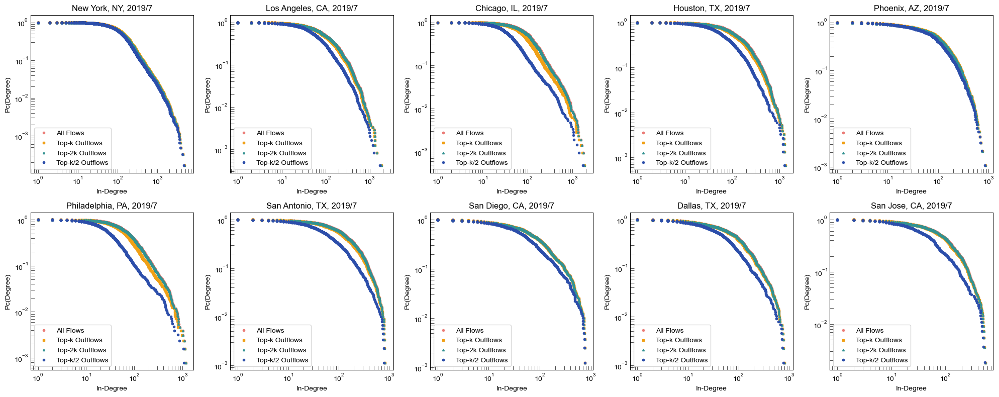

1 New York, NY
Number of nodes to remove:  134
2 Los Angeles, CA
Number of nodes to remove:  54
3 Chicago, IL
Number of nodes to remove:  44
4 Houston, TX
Number of nodes to remove:  32
5 Phoenix, AZ
Number of nodes to remove:  21
6 Philadelphia, PA
Number of nodes to remove:  28
7 San Antonio, TX
Number of nodes to remove:  20
8 San Diego, CA
Number of nodes to remove:  17
9 Dallas, TX
Number of nodes to remove:  19
10 San Jose, CA
Number of nodes to remove:  12


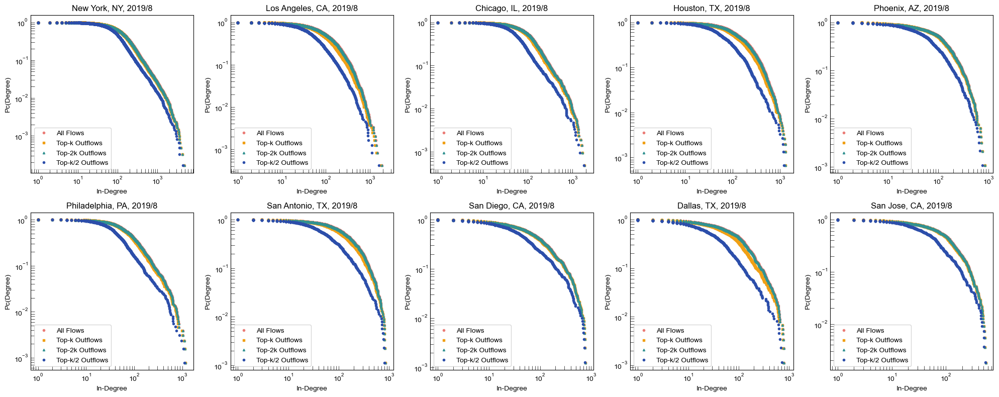

1 New York, NY
Number of nodes to remove:  135
2 Los Angeles, CA
Number of nodes to remove:  51
3 Chicago, IL
Number of nodes to remove:  44
4 Houston, TX
Number of nodes to remove:  32
5 Phoenix, AZ
Number of nodes to remove:  21
6 Philadelphia, PA
Number of nodes to remove:  28
7 San Antonio, TX
Number of nodes to remove:  22
8 San Diego, CA
Number of nodes to remove:  17
9 Dallas, TX
Number of nodes to remove:  20
10 San Jose, CA
Number of nodes to remove:  12


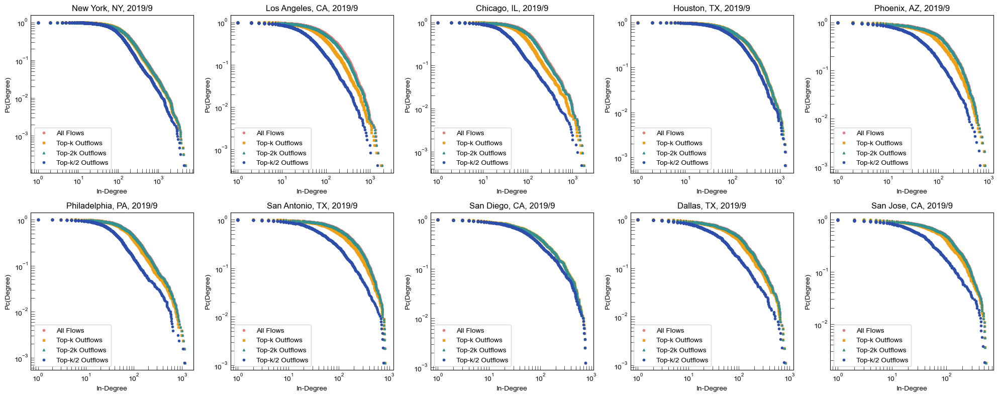

1 New York, NY
Number of nodes to remove:  134
2 Los Angeles, CA
Number of nodes to remove:  52
3 Chicago, IL
Number of nodes to remove:  44
4 Houston, TX
Number of nodes to remove:  33
5 Phoenix, AZ
Number of nodes to remove:  21
6 Philadelphia, PA
Number of nodes to remove:  27
7 San Antonio, TX
Number of nodes to remove:  23
8 San Diego, CA
Number of nodes to remove:  17
9 Dallas, TX
Number of nodes to remove:  20
10 San Jose, CA
Number of nodes to remove:  12


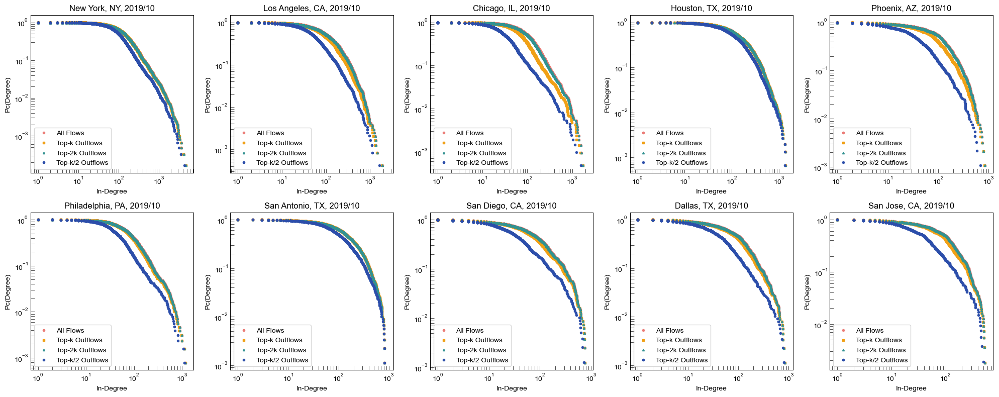

1 New York, NY
Number of nodes to remove:  131
2 Los Angeles, CA
Number of nodes to remove:  51
3 Chicago, IL
Number of nodes to remove:  44
4 Houston, TX
Number of nodes to remove:  32
5 Phoenix, AZ
Number of nodes to remove:  20
6 Philadelphia, PA
Number of nodes to remove:  27
7 San Antonio, TX
Number of nodes to remove:  19
8 San Diego, CA
Number of nodes to remove:  17
9 Dallas, TX
Number of nodes to remove:  19
10 San Jose, CA
Number of nodes to remove:  12


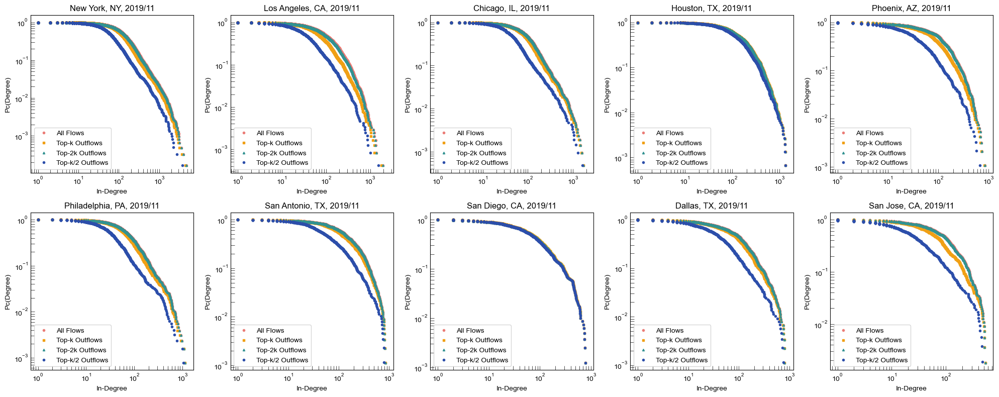

1 New York, NY
Number of nodes to remove:  133
2 Los Angeles, CA
Number of nodes to remove:  53
3 Chicago, IL
Number of nodes to remove:  44
4 Houston, TX
Number of nodes to remove:  32
5 Phoenix, AZ
Number of nodes to remove:  20
6 Philadelphia, PA
Number of nodes to remove:  31
7 San Antonio, TX
Number of nodes to remove:  23
8 San Diego, CA
Number of nodes to remove:  17
9 Dallas, TX
Number of nodes to remove:  19
10 San Jose, CA
Number of nodes to remove:  12


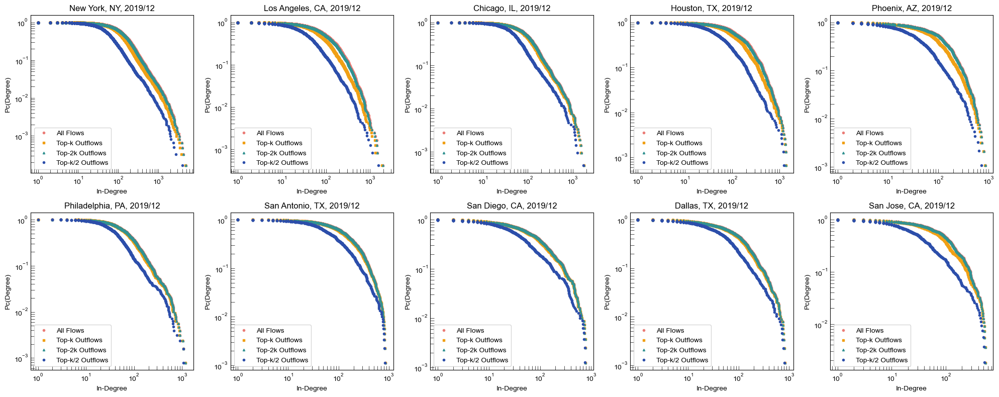

1 New York, NY
Number of nodes to remove:  130
2 Los Angeles, CA
Number of nodes to remove:  53
3 Chicago, IL
Number of nodes to remove:  44
4 Houston, TX
Number of nodes to remove:  33
5 Phoenix, AZ
Number of nodes to remove:  21
6 Philadelphia, PA
Number of nodes to remove:  27
7 San Antonio, TX
Number of nodes to remove:  19
8 San Diego, CA
Number of nodes to remove:  17
9 Dallas, TX
Number of nodes to remove:  20
10 San Jose, CA
Number of nodes to remove:  12


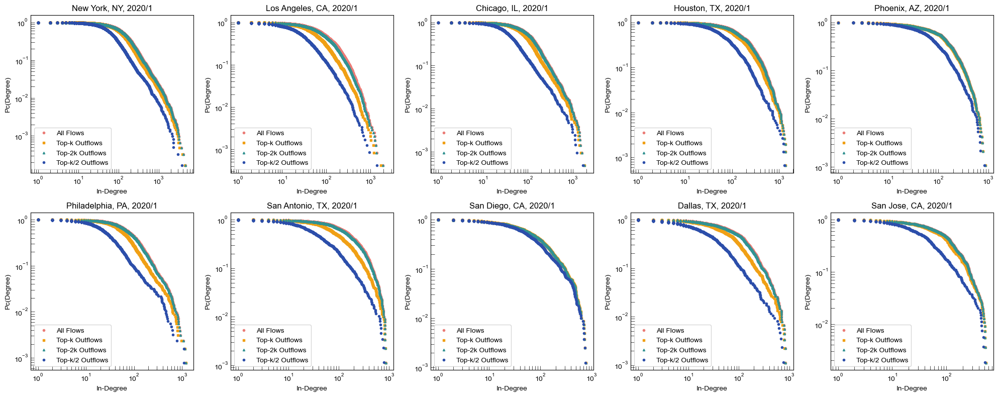

1 New York, NY
Number of nodes to remove:  131
2 Los Angeles, CA
Number of nodes to remove:  53
3 Chicago, IL
Number of nodes to remove:  47
4 Houston, TX
Number of nodes to remove:  32
5 Phoenix, AZ
Number of nodes to remove:  20
6 Philadelphia, PA
Number of nodes to remove:  29
7 San Antonio, TX
Number of nodes to remove:  20
8 San Diego, CA
Number of nodes to remove:  17
9 Dallas, TX
Number of nodes to remove:  19
10 San Jose, CA
Number of nodes to remove:  12


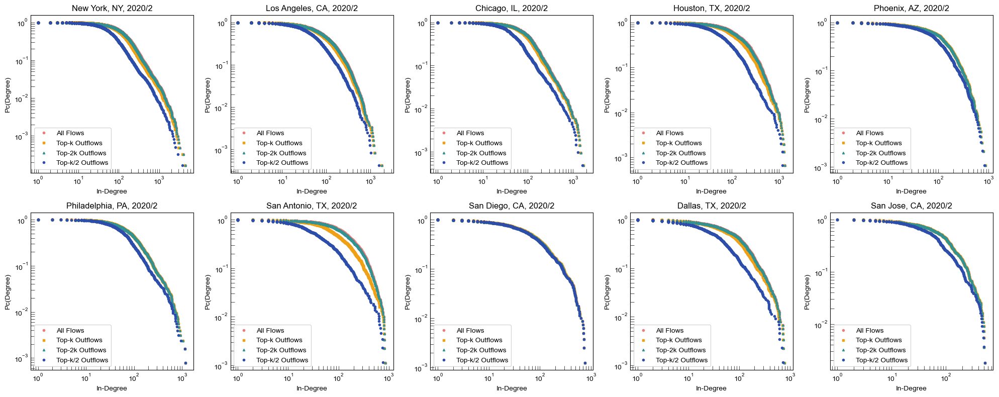

1 New York, NY
Number of nodes to remove:  130
2 Los Angeles, CA
Number of nodes to remove:  56
3 Chicago, IL
Number of nodes to remove:  47
4 Houston, TX
Number of nodes to remove:  32
5 Phoenix, AZ
Number of nodes to remove:  20
6 Philadelphia, PA
Number of nodes to remove:  27
7 San Antonio, TX
Number of nodes to remove:  19
8 San Diego, CA
Number of nodes to remove:  19
9 Dallas, TX
Number of nodes to remove:  22
10 San Jose, CA
Number of nodes to remove:  12


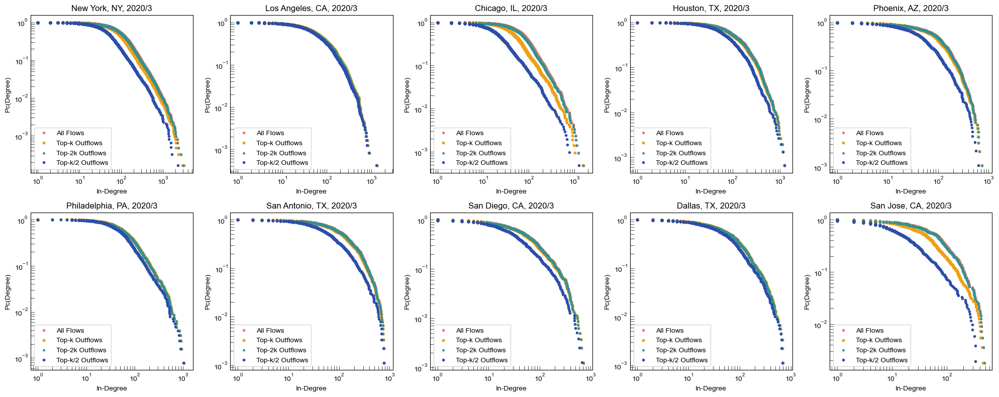

1 New York, NY
Number of nodes to remove:  136
2 Los Angeles, CA
Number of nodes to remove:  55
3 Chicago, IL
Number of nodes to remove:  47
4 Houston, TX
Number of nodes to remove:  33
5 Phoenix, AZ
Number of nodes to remove:  21
6 Philadelphia, PA
Number of nodes to remove:  29
7 San Antonio, TX
Number of nodes to remove:  19
8 San Diego, CA
Number of nodes to remove:  17
9 Dallas, TX
Number of nodes to remove:  22
10 San Jose, CA
Number of nodes to remove:  12


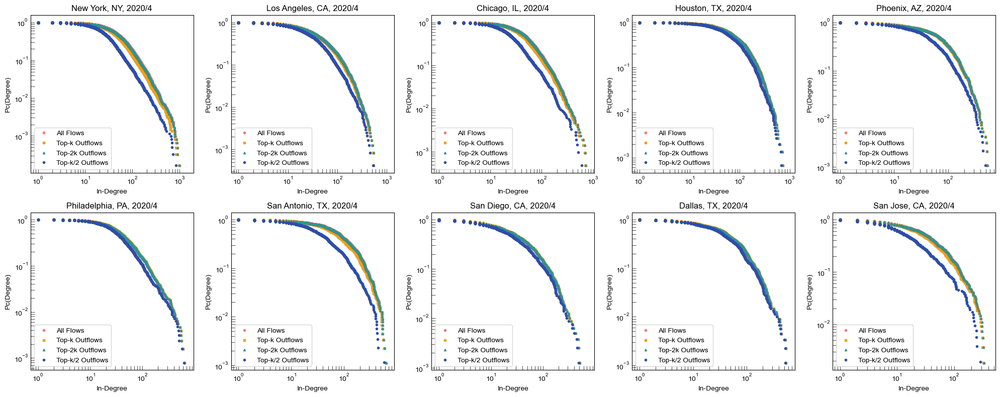

1 New York, NY
Number of nodes to remove:  131
2 Los Angeles, CA
Number of nodes to remove:  52
3 Chicago, IL
Number of nodes to remove:  48
4 Houston, TX
Number of nodes to remove:  35
5 Phoenix, AZ
Number of nodes to remove:  21
6 Philadelphia, PA
Number of nodes to remove:  28
7 San Antonio, TX
Number of nodes to remove:  20
8 San Diego, CA
Number of nodes to remove:  21
9 Dallas, TX
Number of nodes to remove:  21
10 San Jose, CA
Number of nodes to remove:  13


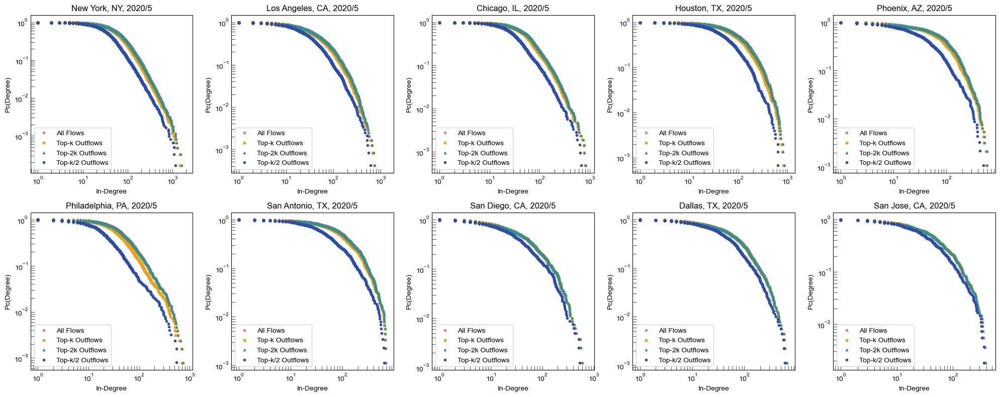

1 New York, NY
Number of nodes to remove:  134
2 Los Angeles, CA
Number of nodes to remove:  56
3 Chicago, IL
Number of nodes to remove:  44
4 Houston, TX
Number of nodes to remove:  32
5 Phoenix, AZ
Number of nodes to remove:  20
6 Philadelphia, PA
Number of nodes to remove:  28
7 San Antonio, TX
Number of nodes to remove:  20
8 San Diego, CA
Number of nodes to remove:  20
9 Dallas, TX
Number of nodes to remove:  21
10 San Jose, CA
Number of nodes to remove:  12


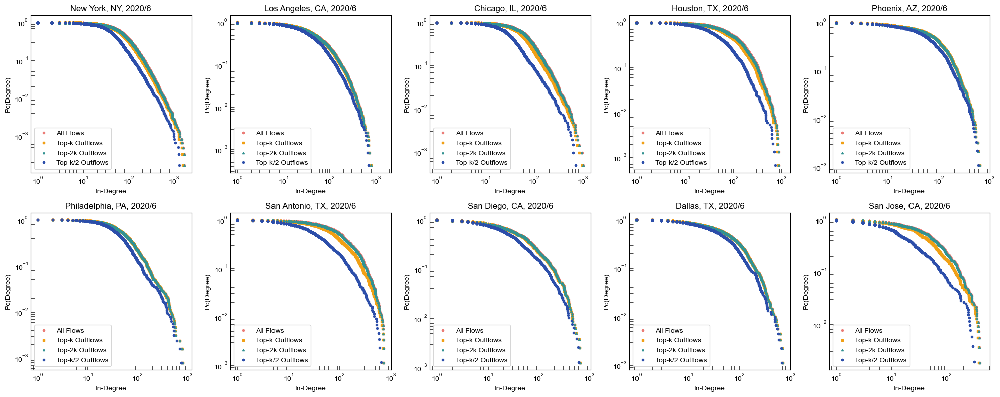

1 New York, NY
Number of nodes to remove:  138
2 Los Angeles, CA
Number of nodes to remove:  57
3 Chicago, IL
Number of nodes to remove:  45
4 Houston, TX
Number of nodes to remove:  34
5 Phoenix, AZ
Number of nodes to remove:  20
6 Philadelphia, PA
Number of nodes to remove:  28
7 San Antonio, TX
Number of nodes to remove:  19
8 San Diego, CA
Number of nodes to remove:  17
9 Dallas, TX
Number of nodes to remove:  20
10 San Jose, CA
Number of nodes to remove:  14


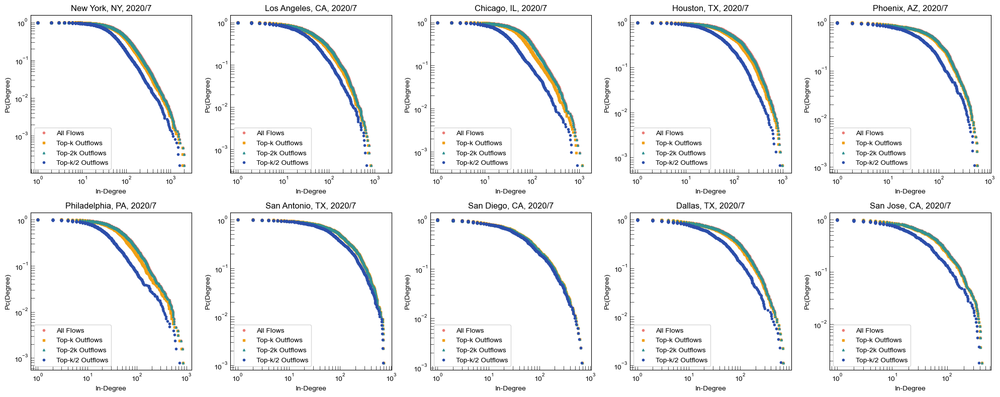

1 New York, NY
Number of nodes to remove:  132
2 Los Angeles, CA
Number of nodes to remove:  52
3 Chicago, IL
Number of nodes to remove:  44
4 Houston, TX
Number of nodes to remove:  36
5 Phoenix, AZ
Number of nodes to remove:  21
6 Philadelphia, PA
Number of nodes to remove:  29
7 San Antonio, TX
Number of nodes to remove:  20
8 San Diego, CA
Number of nodes to remove:  21
9 Dallas, TX
Number of nodes to remove:  19
10 San Jose, CA
Number of nodes to remove:  14


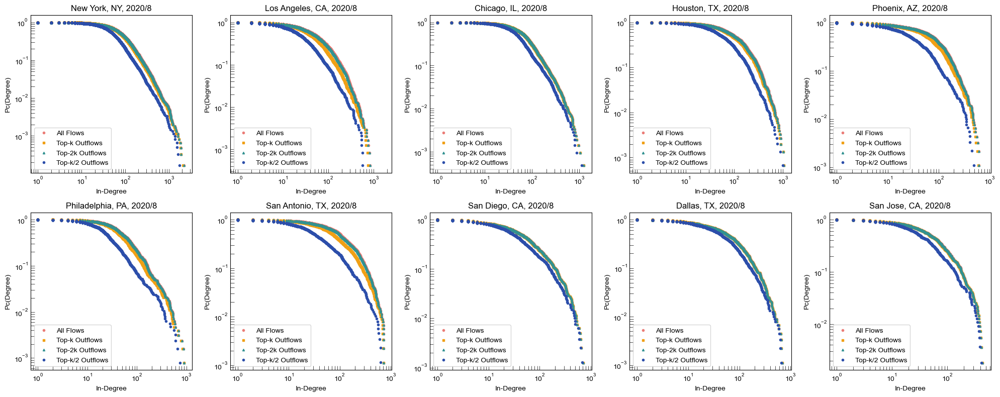

1 New York, NY
Number of nodes to remove:  131
2 Los Angeles, CA
Number of nodes to remove:  51
3 Chicago, IL
Number of nodes to remove:  45
4 Houston, TX
Number of nodes to remove:  32
5 Phoenix, AZ
Number of nodes to remove:  21
6 Philadelphia, PA
Number of nodes to remove:  31
7 San Antonio, TX
Number of nodes to remove:  23
8 San Diego, CA
Number of nodes to remove:  17
9 Dallas, TX
Number of nodes to remove:  20
10 San Jose, CA
Number of nodes to remove:  12


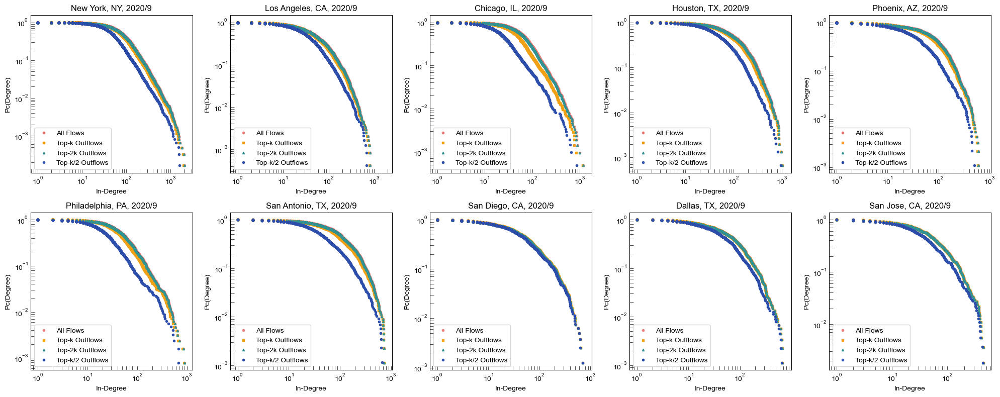

1 New York, NY
Number of nodes to remove:  132
2 Los Angeles, CA
Number of nodes to remove:  53
3 Chicago, IL
Number of nodes to remove:  47
4 Houston, TX
Number of nodes to remove:  32
5 Phoenix, AZ
Number of nodes to remove:  21
6 Philadelphia, PA
Number of nodes to remove:  27
7 San Antonio, TX
Number of nodes to remove:  19
8 San Diego, CA
Number of nodes to remove:  18
9 Dallas, TX
Number of nodes to remove:  20
10 San Jose, CA
Number of nodes to remove:  12


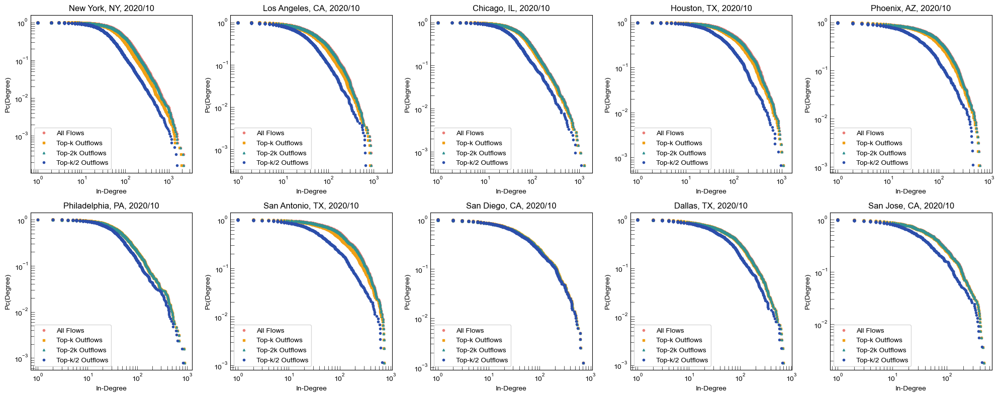

1 New York, NY
Number of nodes to remove:  132
2 Los Angeles, CA
Number of nodes to remove:  55
3 Chicago, IL
Number of nodes to remove:  50
4 Houston, TX
Number of nodes to remove:  34
5 Phoenix, AZ
Number of nodes to remove:  21
6 Philadelphia, PA
Number of nodes to remove:  30
7 San Antonio, TX
Number of nodes to remove:  20
8 San Diego, CA
Number of nodes to remove:  17
9 Dallas, TX
Number of nodes to remove:  19
10 San Jose, CA
Number of nodes to remove:  12


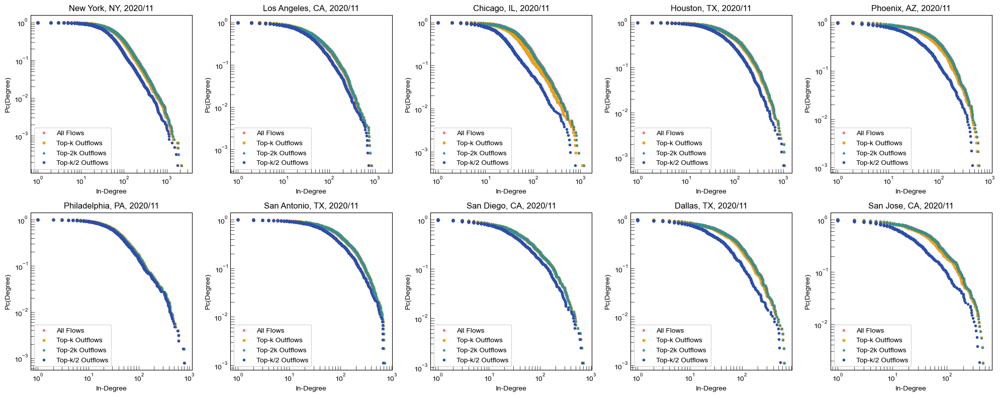

1 New York, NY
Number of nodes to remove:  138
2 Los Angeles, CA
Number of nodes to remove:  52
3 Chicago, IL
Number of nodes to remove:  46
4 Houston, TX
Number of nodes to remove:  34
5 Phoenix, AZ
Number of nodes to remove:  21
6 Philadelphia, PA
Number of nodes to remove:  28
7 San Antonio, TX
Number of nodes to remove:  22
8 San Diego, CA
Number of nodes to remove:  18
9 Dallas, TX
Number of nodes to remove:  19
10 San Jose, CA
Number of nodes to remove:  13


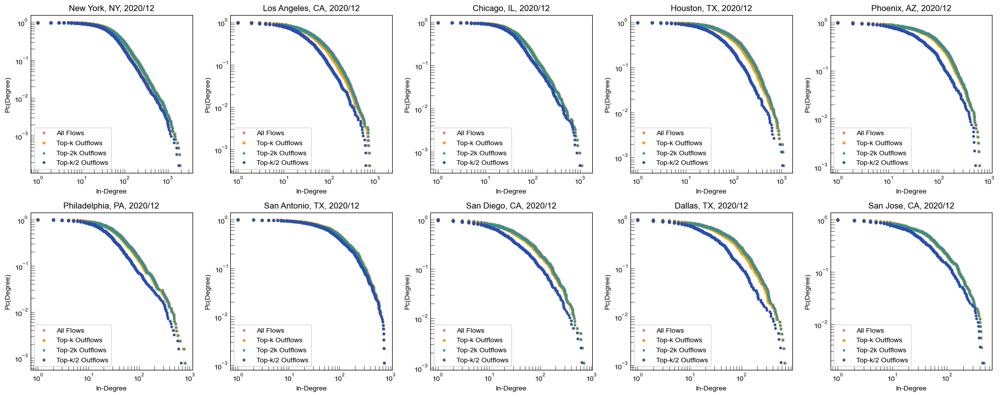

1 New York, NY
Number of nodes to remove:  133
2 Los Angeles, CA
Number of nodes to remove:  51
3 Chicago, IL
Number of nodes to remove:  44
4 Houston, TX
Number of nodes to remove:  33
5 Phoenix, AZ
Number of nodes to remove:  20
6 Philadelphia, PA
Number of nodes to remove:  29
7 San Antonio, TX
Number of nodes to remove:  19
8 San Diego, CA
Number of nodes to remove:  17
9 Dallas, TX
Number of nodes to remove:  19
10 San Jose, CA
Number of nodes to remove:  12


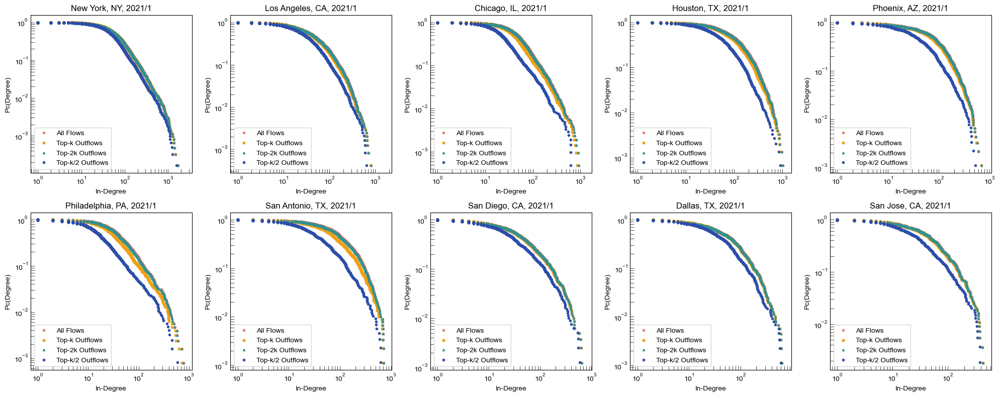

1 New York, NY
Number of nodes to remove:  131
2 Los Angeles, CA
Number of nodes to remove:  53
3 Chicago, IL
Number of nodes to remove:  50
4 Houston, TX
Number of nodes to remove:  32
5 Phoenix, AZ
Number of nodes to remove:  20
6 Philadelphia, PA
Number of nodes to remove:  31
7 San Antonio, TX
Number of nodes to remove:  19
8 San Diego, CA
Number of nodes to remove:  20
9 Dallas, TX
Number of nodes to remove:  21
10 San Jose, CA
Number of nodes to remove:  13


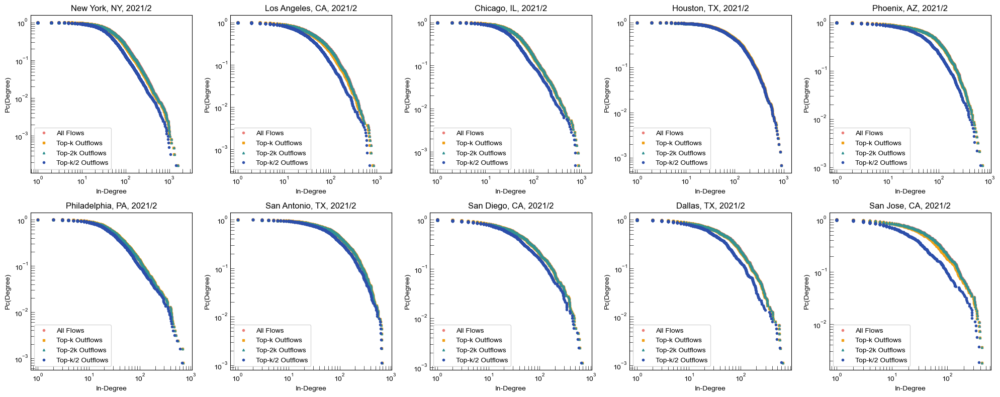

1 New York, NY
Number of nodes to remove:  132
2 Los Angeles, CA
Number of nodes to remove:  54
3 Chicago, IL
Number of nodes to remove:  45
4 Houston, TX
Number of nodes to remove:  34
5 Phoenix, AZ
Number of nodes to remove:  21
6 Philadelphia, PA
Number of nodes to remove:  30
7 San Antonio, TX
Number of nodes to remove:  20
8 San Diego, CA
Number of nodes to remove:  17
9 Dallas, TX
Number of nodes to remove:  19
10 San Jose, CA
Number of nodes to remove:  13


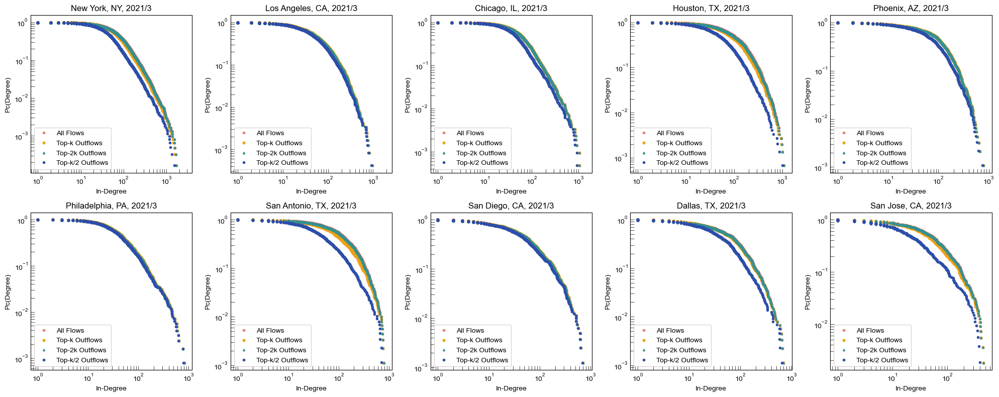

1 New York, NY
Number of nodes to remove:  134
2 Los Angeles, CA
Number of nodes to remove:  52
3 Chicago, IL
Number of nodes to remove:  44
4 Houston, TX
Number of nodes to remove:  34
5 Phoenix, AZ
Number of nodes to remove:  22
6 Philadelphia, PA
Number of nodes to remove:  29
7 San Antonio, TX
Number of nodes to remove:  19
8 San Diego, CA
Number of nodes to remove:  20
9 Dallas, TX
Number of nodes to remove:  19
10 San Jose, CA
Number of nodes to remove:  12


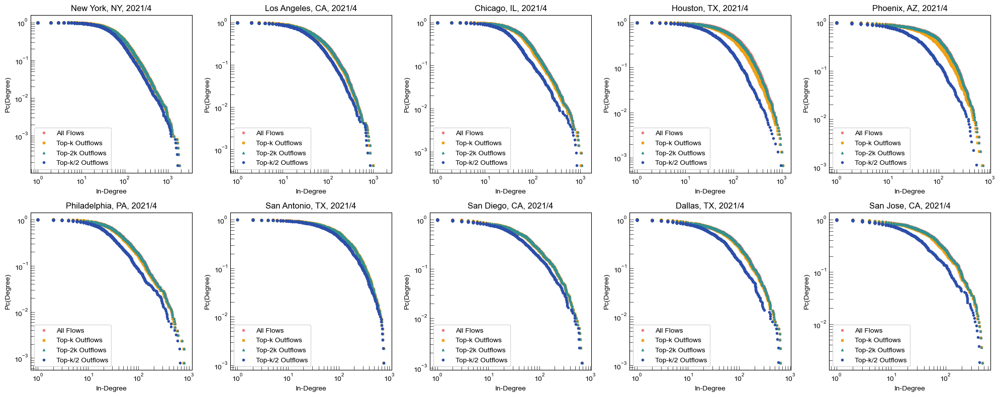

1 New York, NY
Number of nodes to remove:  132
2 Los Angeles, CA
Number of nodes to remove:  52
3 Chicago, IL
Number of nodes to remove:  45
4 Houston, TX
Number of nodes to remove:  32
5 Phoenix, AZ
Number of nodes to remove:  21
6 Philadelphia, PA
Number of nodes to remove:  28
7 San Antonio, TX
Number of nodes to remove:  20
8 San Diego, CA
Number of nodes to remove:  17
9 Dallas, TX
Number of nodes to remove:  19
10 San Jose, CA
Number of nodes to remove:  12


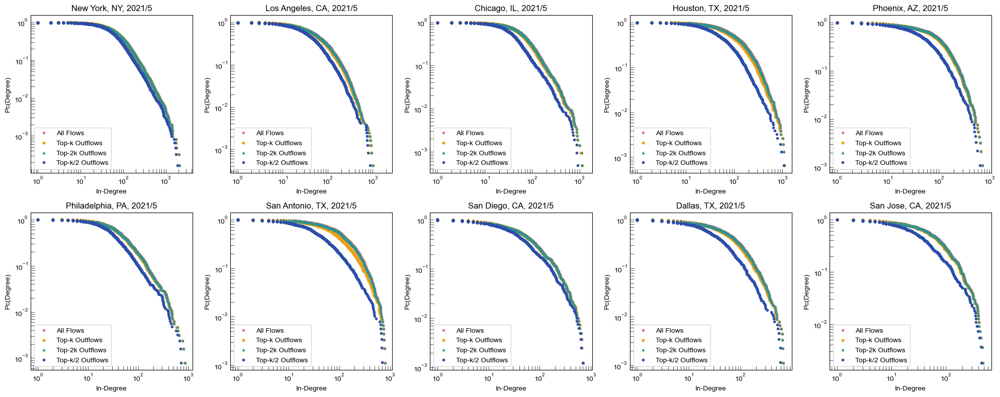

1 New York, NY
Number of nodes to remove:  130
2 Los Angeles, CA
Number of nodes to remove:  54
3 Chicago, IL
Number of nodes to remove:  49
4 Houston, TX
Number of nodes to remove:  34
5 Phoenix, AZ
Number of nodes to remove:  20
6 Philadelphia, PA
Number of nodes to remove:  29
7 San Antonio, TX
Number of nodes to remove:  20
8 San Diego, CA
Number of nodes to remove:  17
9 Dallas, TX
Number of nodes to remove:  22
10 San Jose, CA
Number of nodes to remove:  13


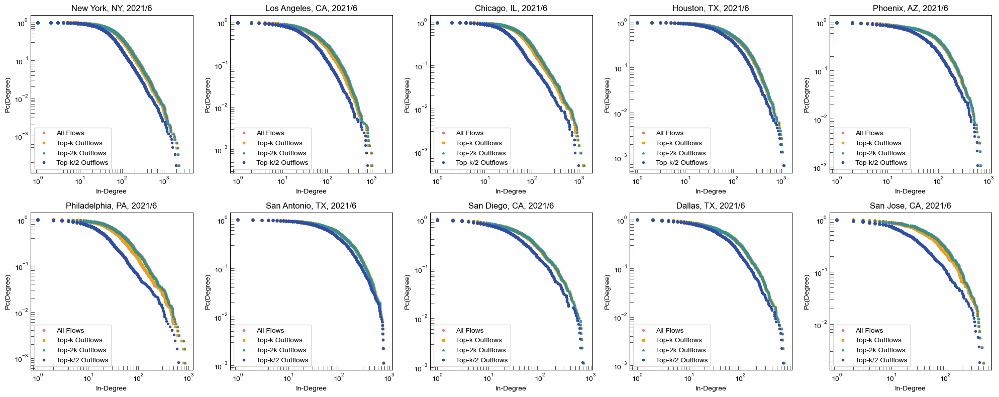

1 New York, NY
Number of nodes to remove:  134
2 Los Angeles, CA
Number of nodes to remove:  52
3 Chicago, IL
Number of nodes to remove:  45
4 Houston, TX
Number of nodes to remove:  32
5 Phoenix, AZ
Number of nodes to remove:  21
6 Philadelphia, PA
Number of nodes to remove:  27
7 San Antonio, TX
Number of nodes to remove:  19
8 San Diego, CA
Number of nodes to remove:  17
9 Dallas, TX
Number of nodes to remove:  20
10 San Jose, CA
Number of nodes to remove:  13


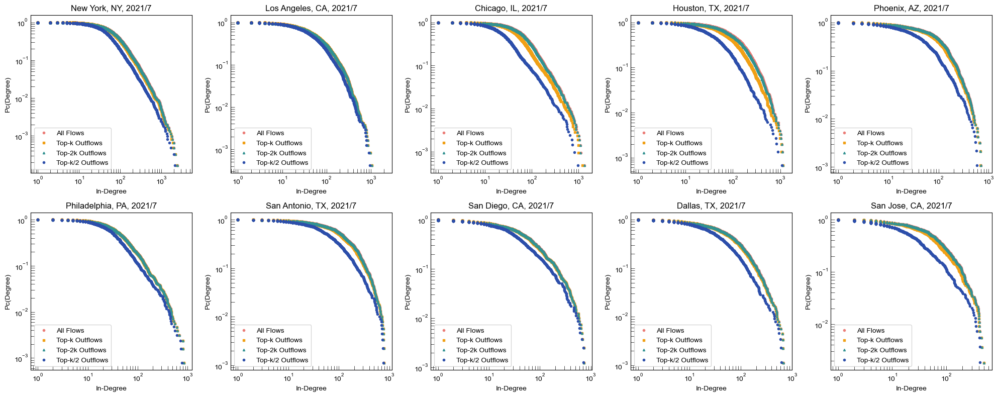

1 New York, NY
Number of nodes to remove:  130
2 Los Angeles, CA
Number of nodes to remove:  52
3 Chicago, IL
Number of nodes to remove:  46
4 Houston, TX
Number of nodes to remove:  32
5 Phoenix, AZ
Number of nodes to remove:  23
6 Philadelphia, PA
Number of nodes to remove:  30
7 San Antonio, TX
Number of nodes to remove:  19
8 San Diego, CA
Number of nodes to remove:  18
9 Dallas, TX
Number of nodes to remove:  19
10 San Jose, CA
Number of nodes to remove:  12


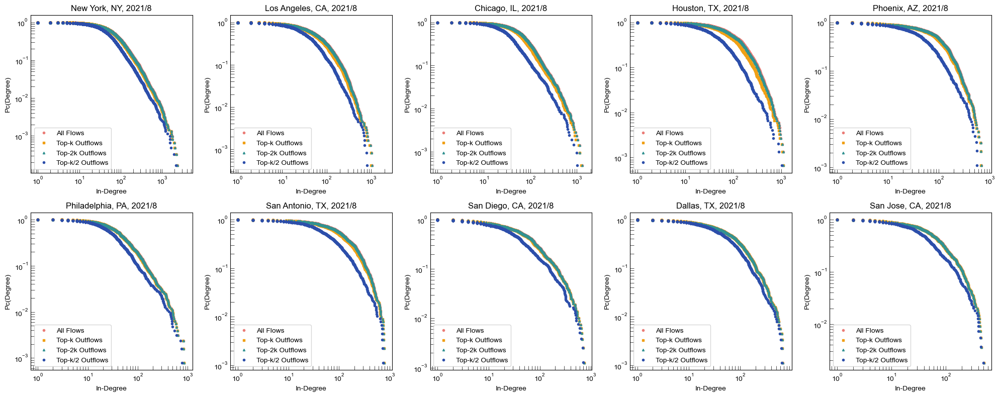

1 New York, NY
Number of nodes to remove:  130
2 Los Angeles, CA
Number of nodes to remove:  53
3 Chicago, IL
Number of nodes to remove:  45
4 Houston, TX
Number of nodes to remove:  36
5 Phoenix, AZ
Number of nodes to remove:  20
6 Philadelphia, PA
Number of nodes to remove:  28
7 San Antonio, TX
Number of nodes to remove:  20
8 San Diego, CA
Number of nodes to remove:  17
9 Dallas, TX
Number of nodes to remove:  20
10 San Jose, CA
Number of nodes to remove:  13


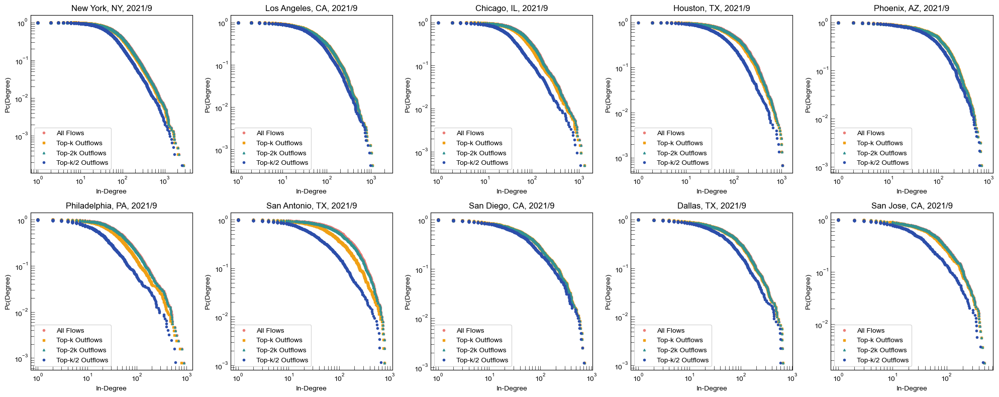

1 New York, NY
Number of nodes to remove:  131
2 Los Angeles, CA
Number of nodes to remove:  57
3 Chicago, IL
Number of nodes to remove:  46
4 Houston, TX
Number of nodes to remove:  32
5 Phoenix, AZ
Number of nodes to remove:  21
6 Philadelphia, PA
Number of nodes to remove:  27
7 San Antonio, TX
Number of nodes to remove:  20
8 San Diego, CA
Number of nodes to remove:  17
9 Dallas, TX
Number of nodes to remove:  22
10 San Jose, CA
Number of nodes to remove:  13


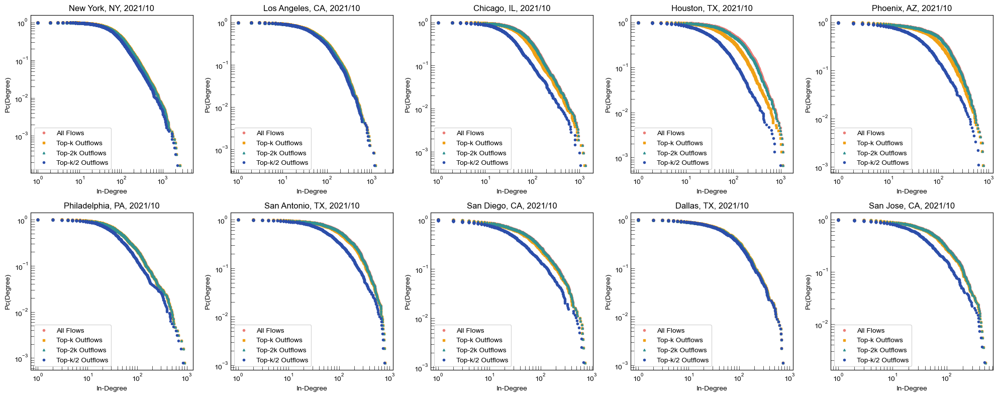

1 New York, NY
Number of nodes to remove:  132
2 Los Angeles, CA
Number of nodes to remove:  53
3 Chicago, IL
Number of nodes to remove:  46
4 Houston, TX
Number of nodes to remove:  34
5 Phoenix, AZ
Number of nodes to remove:  20
6 Philadelphia, PA
Number of nodes to remove:  27
7 San Antonio, TX
Number of nodes to remove:  19
8 San Diego, CA
Number of nodes to remove:  20
9 Dallas, TX
Number of nodes to remove:  20
10 San Jose, CA
Number of nodes to remove:  12


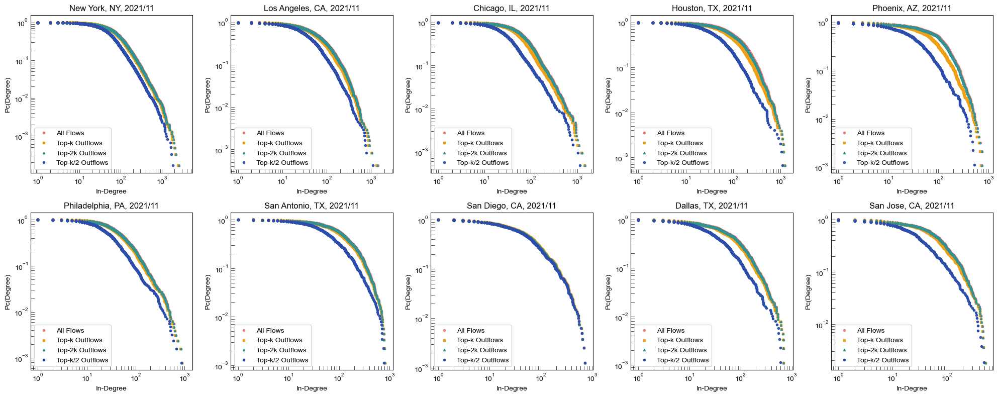

1 New York, NY
Number of nodes to remove:  130
2 Los Angeles, CA
Number of nodes to remove:  56
3 Chicago, IL
Number of nodes to remove:  48
4 Houston, TX
Number of nodes to remove:  34
5 Phoenix, AZ
Number of nodes to remove:  22
6 Philadelphia, PA
Number of nodes to remove:  27
7 San Antonio, TX
Number of nodes to remove:  19
8 San Diego, CA
Number of nodes to remove:  17
9 Dallas, TX
Number of nodes to remove:  19
10 San Jose, CA
Number of nodes to remove:  12


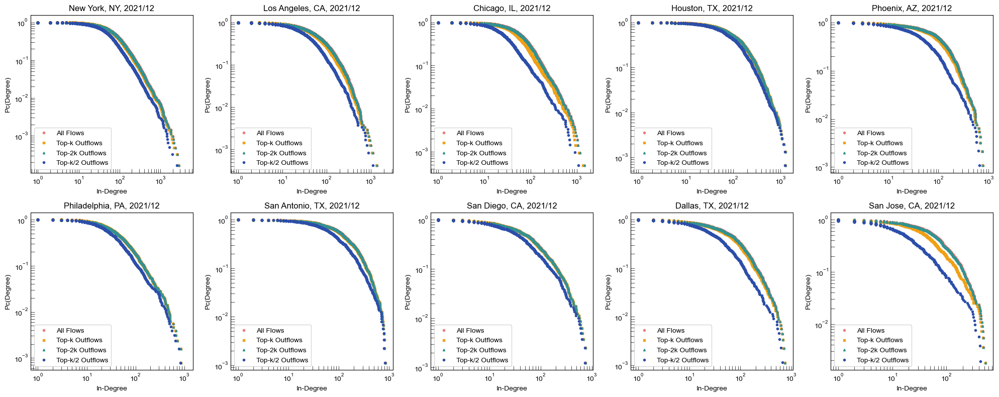

In [29]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import powerlaw
import pickle

plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['Arial']

cities = ['New York, NY', 'Los Angeles, CA', 'Chicago, IL', 'Houston, TX', 'Phoenix, AZ', 'Philadelphia, PA', 'San Antonio, TX', 'San Diego, CA', 'Dallas, TX', 'San Jose, CA']

# 读取新的k值
k_values = pd.read_csv(r".\k_select_US_newNY_2percent.csv")

years = range(2018, 2022)

not_in_cbgs = extract_water_in_NY()

for year in years:
    for month in range(1, 13):
        # 创建一个包含10个子图的大图
        fig, axs = plt.subplots(2, 5, figsize=(20, 8))
        axs = axs.flatten()  # 将二维的子图数组转换为一维，方便迭代

        for city_idx, city in enumerate(cities):
            print(city_idx + 1, city)

            # 根据年份和月份从CSV文件中获取k值
            k = k_values.loc[(k_values['year'] == year) & (k_values['month'] == month), city].values[0]

            flows = np.load(r'D:\Dropbox\urban cup\data\Mobility\cbg_visit_{year_}-{month_}_{city_}.npy'.format(year_=year, month_=str(month).zfill(2), city_=city_idx + 1))
            if city == 1:
                flows = np.delete(flows, not_in_cbgs, axis=0)
                flows = np.delete(flows, not_in_cbgs, axis=1)
            
            flows = preprocess_flows(flows)
            
            # Construct the graph for top-k outflows
            top_k_flows = np.zeros_like(flows)
            top_2k_flows = np.zeros_like(flows)
            top_k2_flows = np.zeros_like(flows)
            for i in range(flows.shape[0]):
                non_zero_flows = np.count_nonzero(flows[i])
                k_flows = min(k, non_zero_flows)
                k2k_flows = min(2 * k, non_zero_flows)
                kk2_flows = min(k // 2, non_zero_flows)
                if k_flows == 0:
                    continue
                top_k_indices = np.argpartition(flows[i], -k_flows)[-k_flows:]
                top_k_flows[i, top_k_indices] = 1
                top_2k_indices = np.argpartition(flows[i], -k2k_flows)[-k2k_flows:]
                top_2k_flows[i, top_2k_indices] = 1
                top_k2_indices = np.argpartition(flows[i], -kk2_flows)[-kk2_flows:]
                top_k2_flows[i, top_k2_indices] = 1

            # extract biggest connected component for top_k2_flows            
            G = nx.from_numpy_array(top_k2_flows, create_using=nx.DiGraph)
            Gc = max(nx.strongly_connected_components(G), key=len)
            top_k2_flows = nx.to_numpy_array(G.subgraph(Gc))
            
            flows_binary = (flows > 0).astype(int)
            degrees_all = np.sum(flows_binary, axis=0)
            degrees_k = np.sum(top_k_flows, axis=0)
            degrees_2k = np.sum(top_2k_flows, axis=0)
            degrees_k2 = np.sum(top_k2_flows, axis=0)

            sorted_degrees = sorted(degrees_all, reverse=True)
            sorted_degrees_k = sorted(degrees_k, reverse=True)
            sorted_degrees_2k = sorted(degrees_2k, reverse=True)
            sorted_degrees_k2 = sorted(degrees_k2, reverse=True)

            # Calculate the CCDF
            ccdf = [(i / len(sorted_degrees)) for i in range(len(sorted_degrees))]
            ccdf_k = [(i / len(sorted_degrees_k)) for i in range(len(sorted_degrees_k))]
            ccdf_2k = [(i / len(sorted_degrees_2k)) for i in range(len(sorted_degrees_2k))]
            ccdf_k2 = [(i / len(sorted_degrees_k2)) for i in range(len(sorted_degrees_k2))]

            #fit = powerlaw.Fit(sorted_degrees_k, discrete=True)

            # 绘制子图
            ax = axs[city_idx]
            colors = ['#eb7c77', '#f0a015', '#329291', '#2c4eaa']
            ax.plot(sorted_degrees[::-1], ccdf[::-1], 'o', color=colors[0], label='All Flows', markersize=3)
            ax.plot(sorted_degrees_k[::-1], ccdf_k[::-1], 's', color=colors[1], label='Top-k Outflows', markersize=3)
            ax.plot(sorted_degrees_2k[::-1], ccdf_2k[::-1], '^', color=colors[2], label='Top-2k Outflows', markersize=3)
            ax.plot(sorted_degrees_k2[::-1], ccdf_k2[::-1], 'o', color=colors[3], label='Top-k/2 Outflows', markersize=3)
            #fit.power_law.plot_ccdf(ax=ax, color='black', linestyle='--', label='Power Law Fit')

            ax.set_xlabel('In-Degree')
            ax.set_ylabel('Pc(Degree)')
            ax.set_xscale('log')
            ax.set_yscale('log')
            ax.tick_params(direction='in', length=6, width=0.5, colors='k', which='both')
            ax.set_title("{city}, {year}/{month}".format(city=city, year=year, month=month))
            ax.legend()

        plt.tight_layout()
        plt.savefig(r"D:\repos\Top-k-network\results\powerlaw_5percent\ccdf_in_degree_distribution_{year}_{month}.png".format(year=year, month=month), dpi=300)
        plt.show()


1 New York, NY
Number of nodes to remove:  131
2 Los Angeles, CA
Number of nodes to remove:  54
3 Chicago, IL
Number of nodes to remove:  44
4 Houston, TX
Number of nodes to remove:  33
5 Phoenix, AZ
Number of nodes to remove:  21
6 Philadelphia, PA
Number of nodes to remove:  27
7 San Antonio, TX
Number of nodes to remove:  19
8 San Diego, CA
Number of nodes to remove:  17
9 Dallas, TX
Number of nodes to remove:  19
10 San Jose, CA
Number of nodes to remove:  12


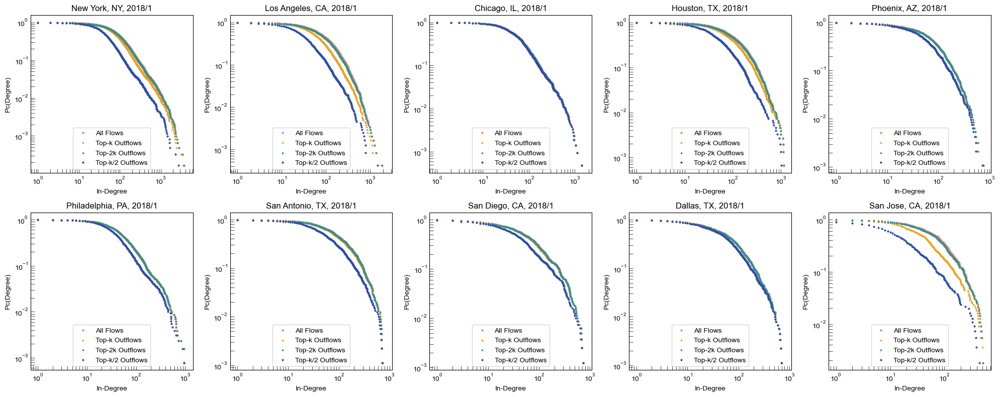

1 New York, NY
Number of nodes to remove:  140
2 Los Angeles, CA
Number of nodes to remove:  51
3 Chicago, IL
Number of nodes to remove:  53
4 Houston, TX
Number of nodes to remove:  35
5 Phoenix, AZ
Number of nodes to remove:  21
6 Philadelphia, PA
Number of nodes to remove:  27
7 San Antonio, TX


KeyboardInterrupt: 

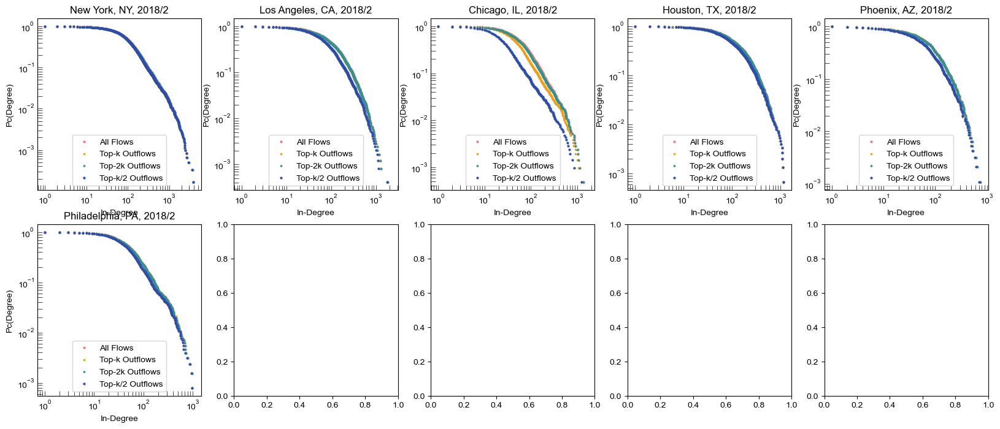

In [25]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import powerlaw
import pickle

plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['Arial']

cities = ['New York, NY', 'Los Angeles, CA', 'Chicago, IL', 'Houston, TX', 'Phoenix, AZ', 'Philadelphia, PA', 'San Antonio, TX', 'San Diego, CA', 'Dallas, TX', 'San Jose, CA']

# 读取新的k值
k_values = pd.read_csv(r".\k_select_US_newNY_2percent.csv")

years = range(2018, 2022)

not_in_cbgs = extract_water_in_NY()

import numpy as np

def ecdf(a):
    x, counts = np.unique(a, return_counts=True)
    cusum = np.cumsum(counts)
    #print(len(a), len(x))
    return x, 1 - cusum / cusum[-1]

import matplotlib.pyplot as plt

def plot_ecdf(a, ax, marker, color, label):
    x, y = ecdf(a)
    x = np.insert(x, 0, x[0])
    y = np.insert(y, 0, 0.)
    ax.plot(x, y,marker, color=color, label=label, markersize=2)
    #ax.grid(True)


for year in years:
    for month in range(1, 13):
        # 创建一个包含10个子图的大图
        fig, axs = plt.subplots(2, 5, figsize=(20, 8))
        axs = axs.flatten()  # 将二维的子图数组转换为一维，方便迭代

        for city_idx, city in enumerate(cities):
            print(city_idx + 1, city)

            # 根据年份和月份从CSV文件中获取k值
            k = k_values.loc[(k_values['year'] == year) & (k_values['month'] == month), city].values[0]

            flows = np.load(r'D:\Dropbox\urban cup\data\Mobility\cbg_visit_{year_}-{month_}_{city_}.npy'.format(year_=year, month_=str(month).zfill(2), city_=city_idx + 1))
            if city == 1:
                flows = np.delete(flows, not_in_cbgs, axis=0)
                flows = np.delete(flows, not_in_cbgs, axis=1)
            
            flows = preprocess_flows(flows)
            
            # Construct the graph for top-k outflows
            top_k_flows = np.zeros_like(flows)
            top_2k_flows = np.zeros_like(flows)
            top_k2_flows = np.zeros_like(flows)
            for i in range(flows.shape[0]):
                non_zero_flows = np.count_nonzero(flows[i])
                k_flows = min(k, non_zero_flows)
                k2k_flows = min(2 * k, non_zero_flows)
                kk2_flows = min(k // 2, non_zero_flows)
                if k_flows == 0:
                    continue
                top_k_indices = np.argpartition(flows[i], -k_flows)[-k_flows:]
                top_k_flows[i, top_k_indices] = 1
                top_2k_indices = np.argpartition(flows[i], -k2k_flows)[-k2k_flows:]
                top_2k_flows[i, top_2k_indices] = 1
                top_k2_indices = np.argpartition(flows[i], -kk2_flows)[-kk2_flows:]
                top_k2_flows[i, top_k2_indices] = 1

            flows_binary = (flows > 0).astype(int)
            degrees_all = np.sum(flows_binary, axis=0)
            degrees_k = np.sum(top_k_flows, axis=0)
            degrees_2k = np.sum(top_2k_flows, axis=0)
            degrees_k2 = np.sum(top_k2_flows, axis=0)

            sorted_degrees = sorted(degrees_all, reverse=True)
            sorted_degrees_k = sorted(degrees_k, reverse=True)
            sorted_degrees_2k = sorted(degrees_2k, reverse=True)
            sorted_degrees_k2 = sorted(degrees_k2, reverse=True)

            # Calculate the CCDF
            ccdf = [(i / len(sorted_degrees)) for i in range(len(sorted_degrees))]
            ccdf_k = [(i / len(sorted_degrees_k)) for i in range(len(sorted_degrees_k))]
            ccdf_2k = [(i / len(sorted_degrees_2k)) for i in range(len(sorted_degrees_2k))]
            ccdf_k2 = [(i / len(sorted_degrees_k2)) for i in range(len(sorted_degrees_k2))]

            #fit = powerlaw.Fit(sorted_degrees_k, discrete=True)

            # 绘制子图
            ax = axs[city_idx]
            colors = ['#eb7c77', '#f0a015', '#329291', '#2c4eaa']
            plot_ecdf(sorted_degrees, ax, 'o', color=colors[0], label='All Flows')
            plot_ecdf(sorted_degrees_k, ax, 's', color=colors[1], label='Top-k Outflows')
            plot_ecdf(sorted_degrees_2k, ax, '^', color=colors[2], label='Top-2k Outflows')
            plot_ecdf(sorted_degrees_k2, ax, 'o', color=colors[3], label='Top-k/2 Outflows')
            #ax.plot(sorted_degrees[::-1], ccdf[::-1], 'o', color=colors[0], label='All Flows', markersize=3)
            #ax.plot(sorted_degrees_k[::-1], ccdf_k[::-1], 's', color=colors[1], label='Top-k Outflows', markersize=3)
            #ax.plot(sorted_degrees_2k[::-1], ccdf_2k[::-1], '^', color=colors[2], label='Top-2k Outflows', markersize=3)
            #ax.plot(sorted_degrees_k2[::-1], ccdf_k2[::-1], 'o', color=colors[3], label='Top-k/2 Outflows', markersize=3)
            #fit.power_law.plot_ccdf(ax=ax, color='black', linestyle='--', label='Power Law Fit')

            ax.set_xlabel('In-Degree')
            ax.set_ylabel('Pc(Degree)')
            ax.set_xscale('log')
            ax.set_yscale('log')
            ax.tick_params(direction='in', length=6, width=0.5, colors='k', which='both')
            ax.set_title("{city}, {year}/{month}".format(city=city, year=year, month=month))
            ax.legend()

        plt.tight_layout()
        #plt.savefig(r"D:\repos\Top-k-network\results\powerlaw\ccdf_in_degree_distribution_{year}_{month}.png".format(year=year, month=month), dpi=300)
        plt.show()


In [ ]:
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming you have your bins and counts calculated and stored in bins_all, bins_t, counts_all, counts_t
# bins_all, bins_t are 1D numpy arrays
# counts_all, counts_t are 1D numpy arrays

# Calculate logarithms of bins and counts
log_bins_all = np.log10(bins_all[:-1])
log_counts_all = np.log10(counts_all)
log_bins_t = np.log10(bins_t[:-1])
log_counts_t = np.log10(counts_t)

# Find the index where bins are close to 110
idx_all = np.abs(bins_all-t).argmin()
idx_t = np.abs(bins_t-t).argmin()

print(log_counts_t)
# Check for invalid values and only keep the valid ones

# inf and nan
invalid_all_left = np.isnan(log_bins_all[:idx_all]) | np.isinf(log_bins_all[:idx_all]) | np.isnan(log_counts_all[:idx_all]) | np.isinf(log_counts_all[:idx_all]) | (log_bins_all[:idx_all] == 0) | (log_counts_all[:idx_all] == 0)
invalid_all_right = np.isnan(log_bins_all[idx_all:]) | np.isinf(log_bins_all[idx_all:]) | np.isnan(log_counts_all[idx_all:]) | np.isinf(log_counts_all[idx_all:]) | (log_bins_all[idx_all:] == 0) | (log_counts_all[idx_all:] == 0)
invalid_t_left = np.isnan(log_bins_t[:idx_t]) | np.isinf(log_bins_t[:idx_t]) | np.isnan(log_counts_t[:idx_t]) | np.isinf(log_counts_t[:idx_t]) | (log_bins_t[:idx_t] == 0) | (log_counts_t[:idx_t] == 0)
invalid_t_right = np.isnan(log_bins_t[idx_t:]) | np.isinf(log_bins_t[idx_t:]) | np.isnan(log_counts_t[idx_t:]) | np.isinf(log_counts_t[idx_t:]) | (log_bins_t[idx_t:] == 0) | (log_counts_t[idx_t:] == 0)

# divide data into 2 parts using cutoff(xmin)
valid_log_bins_all_left = log_bins_all[:idx_all][~invalid_all_left]
valid_log_counts_all_left = log_counts_all[:idx_all][~invalid_all_left]
valid_log_bins_all_right = log_bins_all[idx_all:][~invalid_all_right]
valid_log_counts_all_right = log_counts_all[idx_all:][~invalid_all_right]
valid_log_bins_t_left = log_bins_t[:idx_t][~invalid_t_left]
valid_log_counts_t_left = log_counts_t[:idx_t][~invalid_t_left]
valid_log_bins_t_right = log_bins_t[idx_t:][~invalid_t_right]
valid_log_counts_t_right = log_counts_t[idx_t:][~invalid_t_right]



print(10**valid_log_bins_t_left, 10**valid_log_counts_t_left)
# Fit a line to the log-log plot data for bins < 110 and bins >= 110 separately
slope_all_left, intercept_all_left, _, _, _ = stats.linregress(valid_log_bins_all_left, valid_log_counts_all_left)
slope_all_right, intercept_all_right, _, _, _ = stats.linregress(valid_log_bins_all_right, valid_log_counts_all_right)
slope_t_left, intercept_t_left, _, _, _ = stats.linregress(valid_log_bins_t_left, valid_log_counts_t_left)
slope_t_right, intercept_t_right, _, _, _ = stats.linregress(valid_log_bins_t_right, valid_log_counts_t_right)


# Generate the log-log plot with fitted lines for bins < 110 and bins >= 110 separately
plt.figure(figsize=(12, 5))
plt.loglog(np.concatenate((10**(valid_log_bins_all_left),10**(valid_log_bins_all_right))), np.concatenate((10**(valid_log_counts_all_left),10**(valid_log_counts_all_right))), '.', label='All Flows',markersize=10)
plt.loglog(np.concatenate((10**(valid_log_bins_t_left),10**(valid_log_bins_t_right))), np.concatenate((10**(valid_log_counts_t_left),10**(valid_log_counts_t_right))), '.', label='Top-k Outflows',markersize=10)
#plt.loglog(10**(valid_log_bins_all_left), 10**(intercept_all_left + slope_all_left*valid_log_bins_all_left), '-', label=f'Fitted Line for All Flows (Degree < 110): Slope = {slope_all_left:.2f}')
#plt.loglog(10**(valid_log_bins_all_right), 10**(intercept_all_right + slope_all_right*valid_log_bins_all_right), '-', label=f'Fitted Line for All Flows (Degree >= 110): Slope = {slope_all_right:.2f}')
#plt.loglog(10**(valid_log_bins_t_left), 10**(intercept_t_left + slope_t_left*valid_log_bins_t_left), '-', label=f'Fitted Line for Top-t Outflows (Degree < 110): Slope = {slope_t_left:.2f}')
plt.loglog(10**(valid_log_bins_t_right), 10**(intercept_t_right + slope_t_right*valid_log_bins_t_right), '-', label=f'Fitted Line for Top-k Outflows (Degree >= k): Slope = {slope_t_right:.2f}')

plt.title('Log-Log Plot of Degree Distribution with Fitted Lines')
plt.xlabel('Degree')
plt.ylabel('Frequency')
plt.legend(facecolor='white', framealpha=0.5)

plt.tight_layout()
plt.savefig('Log-Log Plot of Degree Distribution with Fitted Lines.png',dpi=300)
plt.show()


## CCDF to check the powerlaw

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib
# Load the data
flows = np.load(r'D:\Dropbox\urban cup\data\Mobility\cbg_visit_2018-01_2.npy')

#flows = np.load(r'..\data\北京TAZ交互流+用户属性统计\flow_matrix\bj_flow_matrix_201807_liuhuan_reduced.npy')

# Define t
t = 106
flows = (flows > 0).astype(int)
print(flows.sum())
# Construct the graph for top-t outflows
top_t_flows = np.zeros_like(flows)
for i in range(flows.shape[0]):
    # Handle case when there are less than t non-zero flows
    non_zero_flows = np.count_nonzero(flows[i])
    t_flows = min(t, non_zero_flows)
    if t_flows ==0:
        continue
    top_t_indices = np.argpartition(flows[i], -t_flows)[-t_flows:]
    top_t_flows[i, top_t_indices] = 1 # flow presence marked as 1
    
# Convert the original flows to binary
flows_binary = (flows > 0).astype(int)

# Calculate the degrees based on the new definition
#degrees_all = np.sum(np.logical_or(flows_binary, flows_binary.T), axis=1)
#degrees_t = np.sum(np.logical_or(top_t_flows, top_t_flows.T), axis=1)

degrees_all = np.sum(flows_binary, axis=0)
degrees_t = np.sum(top_t_flows, axis=0)

print(degrees_all.sum(),degrees_t.sum())
print(degrees_all.max(), degrees_t.max())
# Change the default style of matplotlib
matplotlib.style.use('ggplot')

# Set a color palette
palette = sns.color_palette("Paired")

# Plot the distributions
plt.figure(figsize=(10, 5))

sns.histplot(degrees_all, kde=True, stat="frequency", label='All Flows', color=palette[1], bins=40)
sns.histplot(degrees_t, kde=True, stat="frequency", label='Top-t Outflows', color=palette[5], bins=40)
plt.title('Total-degree Distribution')
plt.legend()

plt.tight_layout()
plt.savefig("total_degree_distribution.png", dpi = 300)
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
import powerlaw

# Create an example network graph
#G = nx.powerlaw_cluster_graph(1000, 3, 0.2)

# Calculate the degree distribution
#degrees = [degree for _, degree in G.degree()]

# Sort the degrees in descending order
sorted_degrees = sorted(degrees_all, reverse=True)
sorted_degrees_t = sorted(degrees_t, reverse=True)

# Calculate the CCDF
ccdf = [(i / len(sorted_degrees)) for i in range(len(sorted_degrees))]
ccdf_t = [(i / len(sorted_degrees_t)) for i in range(len(sorted_degrees_t))]

fit = powerlaw.Fit(sorted_degrees_t, discrete=True)
print(fit.power_law.alpha, fit.power_law.xmin, fit.power_law.sigma)
print(sorted_degrees, ccdf)
# Plot the CCDF
figure = plt.figure(figsize=(10, 6))
ax = figure.add_subplot(111)
fit.power_law.plot_ccdf(color='b', linestyle='--', ax=ax)

plt.plot(sorted_degrees, ccdf, 'ro', markersize=2)

plt.plot(sorted_degrees_t, ccdf_t, 'bo', markersize=2)
ax.set_xscale('log')
ax.set_yscale('log')
plt.xlabel('Degree (log scale)')
plt.ylabel('CCDF (log scale)')
plt.title('Degree Distribution CCDF')
plt.show()



In [ ]:
fit.alpha

## Weight Distribution

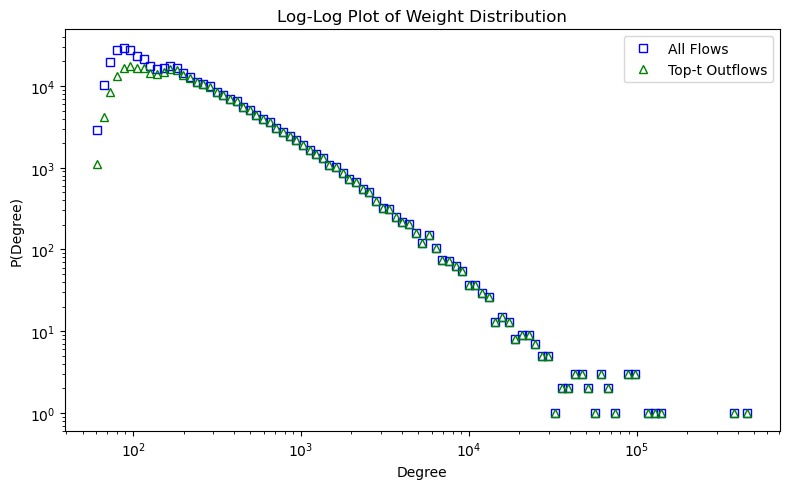

In [ ]:

import numpy as np
import matplotlib.pyplot as plt

flows = np.load(r'D:\Dropbox\urban cup\data\Mobility\cbg_visit_2019-03_2.npy')
weights = flows[flows > 0].flatten()
# Construct the graph for top-t outflows


t = 150
top_t_flows = np.zeros_like(flows)
for i in range(flows.shape[0]):
    # Handle case when there are less than t non-zero flows
    non_zero_flows = np.count_nonzero(flows[i])
    t_flows = min(t, non_zero_flows)
    if t_flows == 0:
        continue
    top_t_indices = np.argpartition(flows[i], -t_flows)[-t_flows:]
    top_t_flows[i, top_t_indices] = flows[i, top_t_indices] # flow presence marked as 1
    

# Calculate the degree distribution frequencies
counts_all, bins_all = np.histogram(weights, bins=np.logspace(np.log10(min(weights+1)), np.log10(max(weights)), num=100))
counts_all_t, bins_all_t = np.histogram(top_t_flows, bins=np.logspace(np.log10(min(weights+1)), np.log10(max(weights)), num=100))

# Generate the log-log plot
plt.figure(figsize=(8, 5))
plt.loglog(bins_all[:-1], counts_all, 's', markerfacecolor='none',color='b', label='All Flows')
plt.loglog(bins_all_t[:-1], counts_all_t, 'g^', color ='g',markerfacecolor='none', label='Top-t Outflows')
plt.title('Log-Log Plot of Weight Distribution')
plt.xlabel('Degree')
plt.ylabel('P(Degree)')

plt.legend()

#plt.savefig("in_degree_distribution_NY_1804(1).png",dpi = 300)
#plt.savefig("total_degree_distribution_LA_1903.png",dpi = 300)
plt.tight_layout()
plt.show()

(6493, 6493)


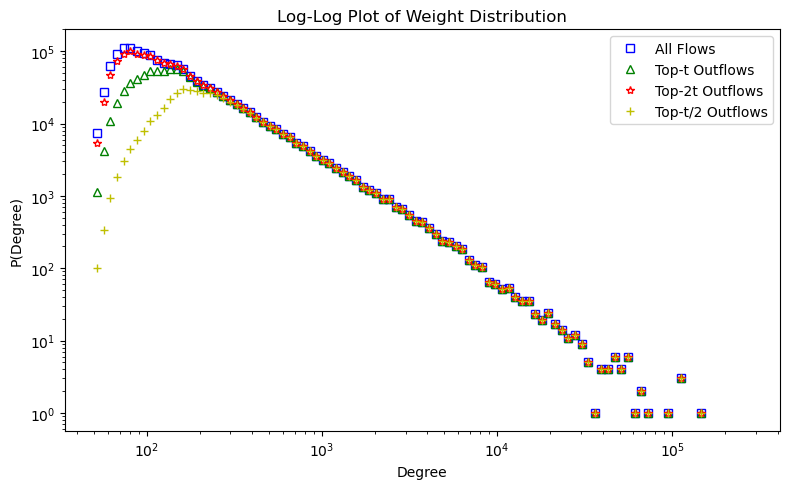

In [ ]:

import numpy as np
import matplotlib.pyplot as plt

flows = np.load(r'D:\Dropbox\urban cup\data\Mobility\cbg_visit_2019-03_1.npy')
weights = flows[flows > 0].flatten()
# Construct the graph for top-t outflows

print(flows.shape)

t = 150
top_t_flows = np.zeros_like(flows)
top_2t_flows = np.zeros_like(flows)
top_t2_flows = np.zeros_like(flows)
for i in range(flows.shape[0]):
    # Handle case when there are less than t non-zero flows
    non_zero_flows = np.count_nonzero(flows[i])
    t_flows = min(t, non_zero_flows)
    tt_flows = min(2*t, non_zero_flows)
    t2_flows = min(t//2, non_zero_flows)
    
    if t_flows == 0:
        continue
    top_t_indices = np.argpartition(flows[i], -t_flows)[-t_flows:]
    top_t_flows[i, top_t_indices] = flows[i, top_t_indices] # flow presence marked as 1
    top_2t_indices = np.argpartition(flows[i], -tt_flows)[-tt_flows:]
    top_2t_flows[i, top_2t_indices] = flows[i, top_2t_indices] # flow presence marked as 1
    top_t2_indices = np.argpartition(flows[i], -t2_flows)[-t2_flows:]
    top_t2_flows[i, top_t2_indices] = flows[i, top_t2_indices] # flow presence marked as 1

# Calculate the degree distribution frequencies
counts_all, bins_all = np.histogram(flows, bins=np.logspace(np.log10(min(weights+1)), np.log10(max(weights)), num=100))
counts_all_t, bins_all_t = np.histogram(top_t_flows, bins=np.logspace(np.log10(min(weights+1)), np.log10(max(weights)), num=100))
counts_2t, bins_2t = np.histogram(top_2t_flows, bins=np.logspace(np.log10(min(weights+1)), np.log10(max(weights)), num=100))
counts_t2, bins_t2 = np.histogram(top_t2_flows, bins=np.logspace(np.log10(min(weights+1)), np.log10(max(weights)), num=100))

# Generate the log-log plot
plt.figure(figsize=(8, 5))
plt.loglog(bins_all[:-1], counts_all, 's', markerfacecolor='none',color='b', label='All Flows')
plt.loglog(bins_all_t[:-1], counts_all_t, 'g^', color ='g',markerfacecolor='none', label='Top-t Outflows')
plt.loglog(bins_2t[:-1], counts_2t, 'r*', color='r',markerfacecolor='none', label='Top-2t Outflows')
plt.loglog(bins_t2[:-1], counts_t2, 'y+', color='y',markerfacecolor='none', label='Top-t/2 Outflows')
plt.title('Log-Log Plot of Weight Distribution')
plt.xlabel('Degree')
plt.ylabel('P(Degree)')

plt.legend()

#plt.savefig("in_degree_distribution_NY_1804(1).png",dpi = 300)
plt.savefig("total_weight_distribution_NY.png",dpi = 300)
plt.tight_layout()
plt.show()

In [ ]:
\